--- 4.926427125930786 seconds ---


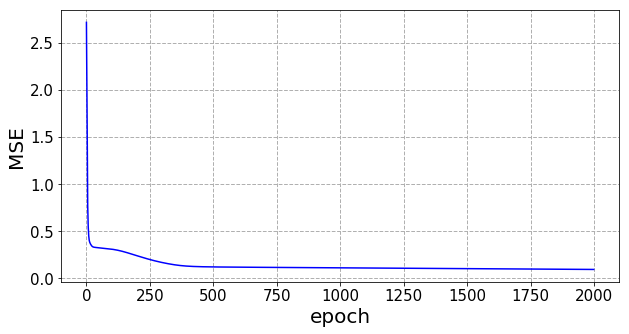

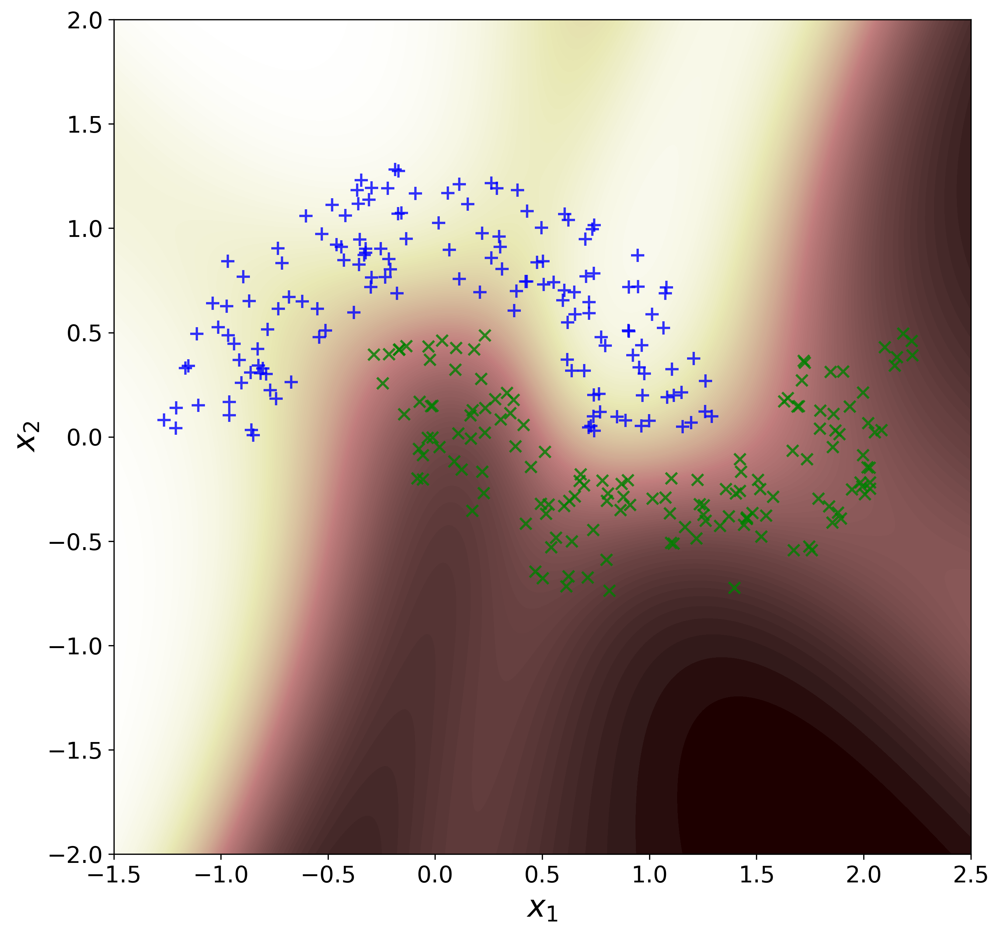

In [2]:
#P1_a
for name in dir():
    del globals()[name]
    
import numpy as np
import numpy.matlib
import matplotlib.pyplot as plt
import time

def trainMLP(X,D,H,eta,alpha,epochMax,MSETarget):
    a = 1.7159
    b = 2/3.
    [p, N] = np.shape(np.array(X))                 #dimension of input vector and number of training data pts
#     m = len(D)                                  #number of output neurons
    m = 1                                  #number of output neurons
    bias = -1                                      #bias value
    Wh=[]
    WhAnt=[]
    X = np.concatenate([bias*np.ones([1,N]),X ],axis=0)                  #add zero'th order terms
    for j in range(len(H)):
        if j ==0:
            Wh.append(np.random.rand(H[j],p+1))                          #initialize first hidden layer weights
            WhAnt.append(np.zeros([H[j],p+1]))                      #initialize variable for weight correction using momentum 
        else:
            Wh.append( np.random.rand(H[j],H[j-1]+1)  ) #initialize hidden layer weights
            WhAnt.append(np.zeros([H[j],H[j-1]+1]) )                #initialize variable for weight correction using momentum 
    Wo = np.random.rand(m,H[-1]+1)                                 #initialize output layer weights
    WoAnt = np.zeros([m,H[-1]+1])                            #initialize variable for weight correction using momentum
    MSETemp = np.zeros([epochMax,1])                   #allocate memory for MSE error for each epoch
    for i in range(epochMax):
        O=[]
        for j in range(len(H)):               #%loop over each hidden layer
            if j==0:
                V = Wh[j]@X               #%weighted sum of inputs [1] Eqn(4.29/30)
            else:
                V = Wh[j]@O[j-1]          #%weighted sum of hidden inputs [1] Eqn(4.29/31)
            PHI = a * np.tanh(b*V)         #%activation function [1] Eqn(4.37)
            O.append(np.concatenate([bias*np.ones([1,N]),PHI],axis=0))   #%add zero'th order terms
        V = Wo@O[-1]                 #%weighted sum of inputs [1] Eqn(4.29)
        Y = a * np.tanh(b*V)       #%activation function [1] Eqn(4.37)
        E = D - Y                  #%calclate error
        mse = np.mean(E**2)    #%calculate mean square error
        MSETemp[i,0] = mse           #%save mse
        #%DISPLAY PROGRESS, BREAK IF ERROR CONSTRAINT MET
#         print('epoch = ' +str(i)+ ' mse = ' +str(mse))
        if (mse < MSETarget):
            MSE = MSETemp
            return(Wh,Wo,MSE)
        PHI_PRMo = b/a *(a-Y)*(a+Y)   #%derivative of activation function [1] Eqn(4.38)
        dGo = E * PHI_PRMo                 #%local gradient [1] Eqn(4.35/39)
        DWo = dGo@O[-1].T                    #%non-scaled weight correction [1] Eqn(4.27)

        Wo = Wo + eta*DWo + alpha*WoAnt  #%weight correction including momentum term [1] Eqn(4.41)
        WoAnt = eta*DWo + alpha*WoAnt                         #%save weight correction for momentum calculation
        for j in np.arange(len(H))[::-1]:
            PHI_PRMh = b/a *(a-O[j])*(a+O[j])         #%derivative of activation function [1] Eqn(4.38)
            if j==(len(H)-1):
                dGh = PHI_PRMh * (Wo.T @ dGo)                   #%local gradient[1] Eqn(4.36/40)
            else:
                dGh = PHI_PRMh * (Wh[j+1].T @ np.matlib.repmat( dGo,Wh[j+1].shape[0],1 ) )         # %local gradient[1] Eqn(4.36/40)
            dGh = dGh[1:,:]                             #%dicard first row of local gradient (bias doesn't update)
            if j==0:
                DWh = dGh@X.T                            #%non-scaled weight correction [1] Eqn(4.27/30)
            else:
                DWh = dGh@O[j-1].T                       #%non-scaled weight correction [1] Eqn(4.27/31)
            Wh[j] =Wh[j]+ eta*DWh + alpha*WhAnt[j]  # %weight correction including momentum term [1] Eqn(4.41)
            WhAnt[j] =eta*DWh + alpha*WhAnt[j]     #%save weight correction for momentum calculation
    MSE = MSETemp
    return(Wh,Wo,MSE)

def MLP(X,Wh,Wo):
    a = 1.7159
    b = 2/3.
    N = len(X[0,:])               #%number of training data pts
    bias = -1                  # %initial bias value
    O=[]
    X = np.concatenate((bias*np.ones([1,N]) , X),axis=0)    #%add zero'th order terms
    H=[]
    for j in range(len(Wh)):
        H.append(len(Wh[j]))
    for j in range(len(H)):               #%loop over each hidden layer
        if j==0:
            V = Wh[j]@X               #%weighted sum of inputs [1] Eqn(4.29/30)
        else:
            V = Wh[j]@O[j-1]          #%weighted sum of hidden inputs [1] Eqn(4.29/31)
        
        PHI = a * np.tanh(b*V)     #%acivation function [1] Eqn(4.37)
        O.append( np.concatenate((bias*np.ones([1,N]),PHI),axis=0))   #%add zero'th order terms
    V = Wo@O[-1]            #%weighted sum of inputs [1] Eqn(4.29)
    Y = a * np.tanh(b*V)    #%activation function [1] Eqn(4.37)
    return Y

def doublemoon(N,d,r,w):
    ro1=np.random.uniform(low=r-w/2,high=r+w/2,size=N//2)
    t1=np.random.uniform(low=0,high=np.pi,size=N//2)
    x1=ro1*np.cos(t1)
    y1=ro1*np.sin(t1)
    l1=np.ones((1,N//2))
    
    ro2=np.random.uniform(low=r-w/2,high=r+w/2,size=N//2)
    t2=np.random.uniform(low=np.pi,high=2*np.pi,size=N//2)
    x2=ro2*np.cos(t2)+r
    y2=ro2*np.sin(t2)-d
    l2=-1*np.ones((1,N//2))
    
    E=np.vstack((x1,y1,l1,x2,y2,l2))
    return E

start_time=time.time()

#Data parameter definition
N=300
r=1
w=0.6
d=-0.5
#NN parameters
H=[10]
eta=0.001
alpha=0.1
epochMax=2000
MSETarget=1e-12

numIter=20

MSE=np.zeros((epochMax,numIter))

#iterating the training process
for i in range(numIter):
    E=doublemoon(N,d,r,w)
    E=np.hstack((E[0:3,:],E[3:6,:]))
    X=E[0:2,:]
    D=E[None,-1,:]
    NN=trainMLP(X,D,H,eta,alpha,epochMax,MSETarget)
    MSE[:,i,None]=NN[2]
#__________________________________________________
#P1_b

Wh=NN[0]
Wo=NN[1]

Y=MLP(X,Wh,Wo)
Y[Y>=0]=1
Y[Y<0]=-1

#indexing data according to lables
i1=np.squeeze(np.equal(Y+D,2*np.ones((Y.shape[0],1))))
i2=np.squeeze(np.equal(Y+D,-2*np.ones((Y.shape[0],1))))
i3=np.squeeze(np.equal(Y+D,np.zeros((Y.shape[0],1))))
#printing the grid
nn=500
nodes1=np.linspace(-1.5,2.5,nn)
nodes2=np.linspace(-2.0,2.0,nn)
x1, x2 = np.meshgrid(nodes1, nodes2)
NodeTag=np.zeros((nn,nn))
crd=np.stack((x1,x2),axis=2)
crd=np.reshape(crd,(nn**2,2),order='C')
crd=crd.T
y1=MLP(crd,Wh,Wo)
y1=np.reshape(y1,(nn,nn))

print("--- %s seconds ---" % (time.time() - start_time))

fig1=plt.figure(figsize=[10,5])
plt.plot(np.arange(epochMax),np.mean(MSE,axis=1),c="b")
plt.xlabel('epoch',fontsize=20)
plt.ylabel('MSE',fontsize=20)
plt.xticks(fontsize=15)
plt.yticks(fontsize=15)
plt.grid('True',linestyle='--', linewidth=1)
plt.show(fig1)
# fig1.savefig('p1_a.svg',format='svg')
#plotting
fig2=plt.figure(figsize=[10,10],dpi=300)
plt.contourf(x1,x2,y1,150,cmap='pink', linewidths=3,linestyles='solid')
plt.scatter(X[0,i1], X[1,i1], alpha=0.8,marker='+', c='b', edgecolors='none', s=75)
plt.scatter(X[0,i2], X[1,i2], alpha=0.8,marker='x', c='g', edgecolors='none', s=55)
plt.scatter(X[0,i3], X[1,i3], alpha=0.8,marker='*', c='r', edgecolors='none', s=95)
plt.axis([-1.5,2.5,-2.0,2.0])
plt.xlabel('$x_1$',fontsize=20)
plt.ylabel('$x_2$',fontsize=20)
plt.xticks(fontsize=15)
plt.yticks(fontsize=15)
plt.show(fig2)
# fig2.savefig('p1_b.svg',format='svg')


--- 7.097661972045898 seconds ---


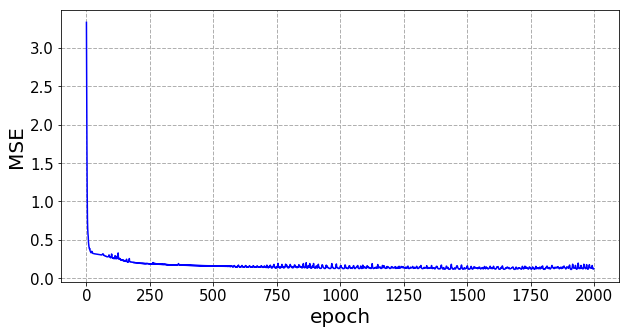

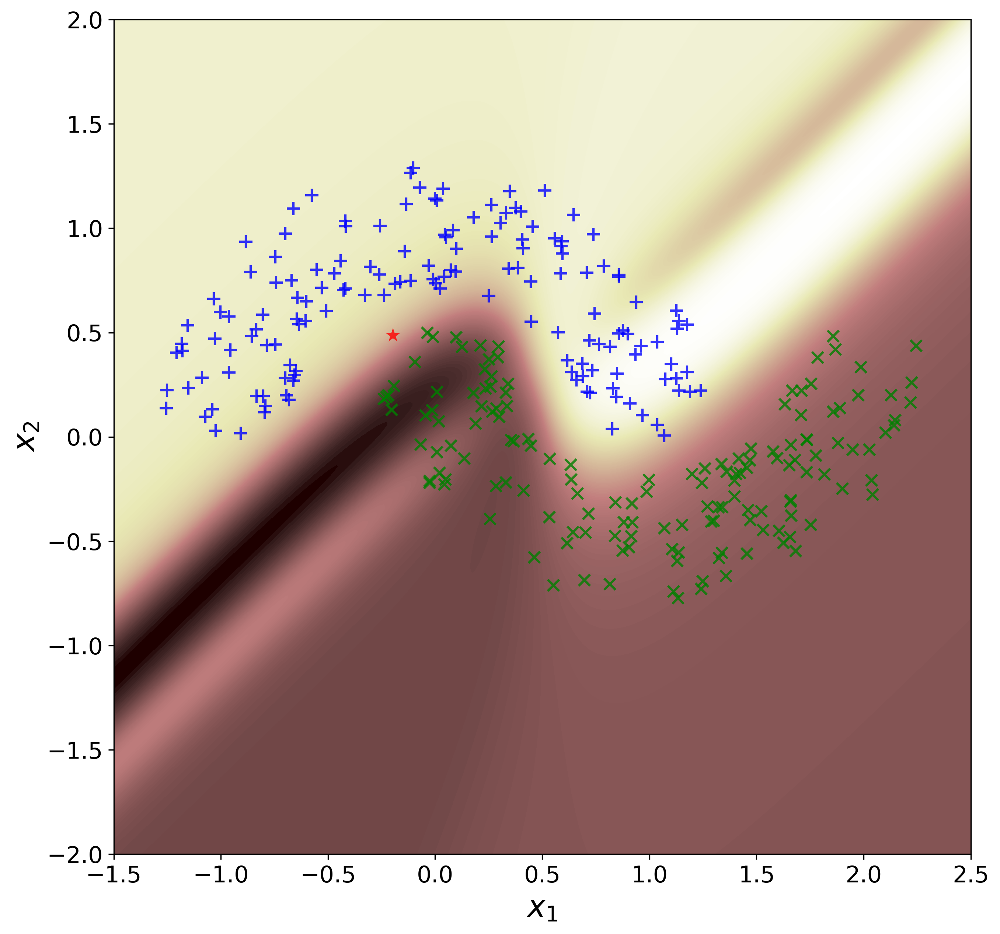

In [4]:
#P1_c
for name in dir():
    del globals()[name]
    
import numpy as np
import numpy.matlib
import matplotlib.pyplot as plt
import time

def trainMLP(X,D,H,eta,alpha,epochMax,MSETarget):
    a = 1.7159
    b = 2/3.
    [p, N] = np.shape(np.array(X))                 #dimension of input vector and number of training data pts
#     m = len(D)                                  #number of output neurons
    m = 1                                  #number of output neurons
    bias = -1                                      #bias value
    Wh=[]
    WhAnt=[]
    X = np.concatenate([bias*np.ones([1,N]),X ],axis=0)                  #add zero'th order terms
    for j in range(len(H)):
        if j ==0:
            Wh.append(np.random.rand(H[j],p+1))                          #initialize first hidden layer weights
            WhAnt.append(np.zeros([H[j],p+1]))                      #initialize variable for weight correction using momentum 
        else:
            Wh.append( np.random.rand(H[j],H[j-1]+1)  ) #initialize hidden layer weights
            WhAnt.append(np.zeros([H[j],H[j-1]+1]) )                #initialize variable for weight correction using momentum 
    Wo = np.random.rand(m,H[-1]+1)                                 #initialize output layer weights
    WoAnt = np.zeros([m,H[-1]+1])                            #initialize variable for weight correction using momentum
    MSETemp = np.zeros([epochMax,1])                   #allocate memory for MSE error for each epoch
    for i in range(epochMax):
        O=[]
        for j in range(len(H)):               #%loop over each hidden layer
            if j==0:
                V = Wh[j]@X               #%weighted sum of inputs [1] Eqn(4.29/30)
            else:
                V = Wh[j]@O[j-1]          #%weighted sum of hidden inputs [1] Eqn(4.29/31)
            PHI = a * np.tanh(b*V)         #%activation function [1] Eqn(4.37)
            O.append(np.concatenate([bias*np.ones([1,N]),PHI],axis=0))   #%add zero'th order terms
        V = Wo@O[-1]                 #%weighted sum of inputs [1] Eqn(4.29)
        Y = a * np.tanh(b*V)       #%activation function [1] Eqn(4.37)
        E = D - Y                  #%calclate error
        mse = np.mean(E**2)    #%calculate mean square error
        MSETemp[i,0] = mse           #%save mse
        #%DISPLAY PROGRESS, BREAK IF ERROR CONSTRAINT MET
#         print('epoch = ' +str(i)+ ' mse = ' +str(mse))
        if (mse < MSETarget):
            MSE = MSETemp
            return(Wh,Wo,MSE)
        PHI_PRMo = b/a *(a-Y)*(a+Y)   #%derivative of activation function [1] Eqn(4.38)
        dGo = E * PHI_PRMo                 #%local gradient [1] Eqn(4.35/39)
        DWo = dGo@O[-1].T                    #%non-scaled weight correction [1] Eqn(4.27)

        Wo = Wo + eta*DWo + alpha*WoAnt  #%weight correction including momentum term [1] Eqn(4.41)
        WoAnt = eta*DWo + alpha*WoAnt                         #%save weight correction for momentum calculation
        for j in np.arange(len(H))[::-1]:
            PHI_PRMh = b/a *(a-O[j])*(a+O[j])         #%derivative of activation function [1] Eqn(4.38)
            if j==(len(H)-1):
                dGh = PHI_PRMh * (Wo.T @ dGo)                   #%local gradient[1] Eqn(4.36/40)
            else:
                dGh = PHI_PRMh * (Wh[j+1].T @ np.matlib.repmat( dGo,Wh[j+1].shape[0],1 ) )         # %local gradient[1] Eqn(4.36/40)
            dGh = dGh[1:,:]                             #%dicard first row of local gradient (bias doesn't update)
            if j==0:
                DWh = dGh@X.T                            #%non-scaled weight correction [1] Eqn(4.27/30)
            else:
                DWh = dGh@O[j-1].T                       #%non-scaled weight correction [1] Eqn(4.27/31)
            Wh[j] =Wh[j]+ eta*DWh + alpha*WhAnt[j]  # %weight correction including momentum term [1] Eqn(4.41)
            WhAnt[j] =eta*DWh + alpha*WhAnt[j]     #%save weight correction for momentum calculation
    MSE = MSETemp
    return(Wh,Wo,MSE)

def MLP(X,Wh,Wo):
    a = 1.7159
    b = 2/3.
    N = len(X[0,:])               #%number of training data pts
    bias = -1                  # %initial bias value
    O=[]
    X = np.concatenate((bias*np.ones([1,N]) , X),axis=0)    #%add zero'th order terms
    H=[]
    for j in range(len(Wh)):
        H.append(len(Wh[j]))
    for j in range(len(H)):               #%loop over each hidden layer
        if j==0:
            V = Wh[j]@X               #%weighted sum of inputs [1] Eqn(4.29/30)
        else:
            V = Wh[j]@O[j-1]          #%weighted sum of hidden inputs [1] Eqn(4.29/31)
        
        PHI = a * np.tanh(b*V)     #%acivation function [1] Eqn(4.37)
        O.append( np.concatenate((bias*np.ones([1,N]),PHI),axis=0))   #%add zero'th order terms
    V = Wo@O[-1]            #%weighted sum of inputs [1] Eqn(4.29)
    Y = a * np.tanh(b*V)    #%activation function [1] Eqn(4.37)
    return Y

def doublemoon(N,d,r,w):
    ro1=np.random.uniform(low=r-w/2,high=r+w/2,size=N//2)
    t1=np.random.uniform(low=0,high=np.pi,size=N//2)
    x1=ro1*np.cos(t1)
    y1=ro1*np.sin(t1)
    l1=np.ones((1,N//2))
    
    ro2=np.random.uniform(low=r-w/2,high=r+w/2,size=N//2)
    t2=np.random.uniform(low=np.pi,high=2*np.pi,size=N//2)
    x2=ro2*np.cos(t2)+r
    y2=ro2*np.sin(t2)-d
    l2=-1*np.ones((1,N//2))
    
    E=np.vstack((x1,y1,l1,x2,y2,l2))
    return E

start_time=time.time()

#Data parameter definition
N=300
r=1
w=0.6
d=-0.5
#NN parameters
H=[5,5]
eta=0.001
alpha=0.1
epochMax=2000
MSETarget=1e-12

numIter=20

MSE=np.zeros((epochMax,numIter))

#iterating the training process
for i in range(numIter):
    E=doublemoon(N,d,r,w)
    E=np.hstack((E[0:3,:],E[3:6,:]))
    # #shuffling
    # i=np.arange(N)
    # np.random.shuffle(i)
    # E=E[:,i]
    X=E[0:2,:]
    D=E[None,-1,:]
    NN=trainMLP(X,D,H,eta,alpha,epochMax,MSETarget)
    MSE[:,i,None]=NN[2]
#__________________________________________________
#P1_d

Wh=NN[0]
Wo=NN[1]

Y=MLP(X,Wh,Wo)
Y[Y>=0]=1
Y[Y<0]=-1

#indexing data according to lables
i1=np.squeeze(np.equal(Y+D,2*np.ones((Y.shape[0],1))))
i2=np.squeeze(np.equal(Y+D,-2*np.ones((Y.shape[0],1))))
i3=np.squeeze(np.equal(Y+D,np.zeros((Y.shape[0],1))))
#printing the grid
nn=500
nodes1=np.linspace(-1.5,2.5,nn)
nodes2=np.linspace(-2.0,2.0,nn)
x1, x2 = np.meshgrid(nodes1, nodes2)
NodeTag=np.zeros((nn,nn))
crd=np.stack((x1,x2),axis=2)
crd=np.reshape(crd,(nn**2,2),order='C')
crd=crd.T
y1=MLP(crd,Wh,Wo)
y1=np.reshape(y1,(nn,nn))


print("--- %s seconds ---" % (time.time() - start_time))

fig1=plt.figure(figsize=[10,5])
plt.plot(np.arange(epochMax),np.mean(MSE,axis=1),c="b")
plt.xlabel('epoch',fontsize=20)
plt.ylabel('MSE',fontsize=20)
plt.xticks(fontsize=15)
plt.yticks(fontsize=15)
plt.grid('True',linestyle='--', linewidth=1)
plt.show(fig1)
# fig1.savefig('p1_d.svg',format='svg')
#plotting
fig2=plt.figure(figsize=[10,10],dpi=300)
plt.contourf(x1,x2,y1,150,cmap='pink', linewidths=3,linestyles='solid')
plt.scatter(X[0,i1], X[1,i1], alpha=0.8,marker='+', c='b', edgecolors='none', s=75)
plt.scatter(X[0,i2], X[1,i2], alpha=0.8,marker='x', c='g', edgecolors='none', s=55)
plt.scatter(X[0,i3], X[1,i3], alpha=0.8,marker='*', c='r', edgecolors='none', s=95)
plt.axis([-1.5,2.5,-2.0,2.0])
plt.xlabel('$x_1$',fontsize=20)
plt.ylabel('$x_2$',fontsize=20)
plt.xticks(fontsize=15)
plt.yticks(fontsize=15)
plt.show(fig2)
# fig2.savefig('p1_c.svg',format='svg')


--- 8.239536762237549 seconds ---


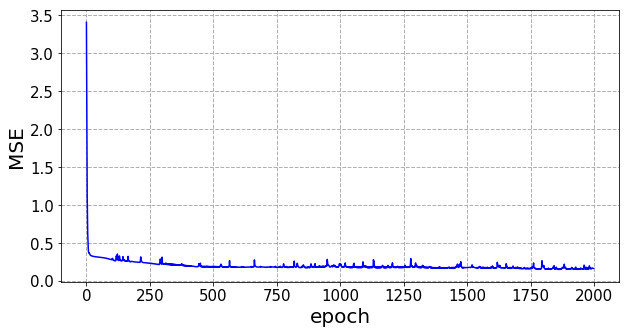

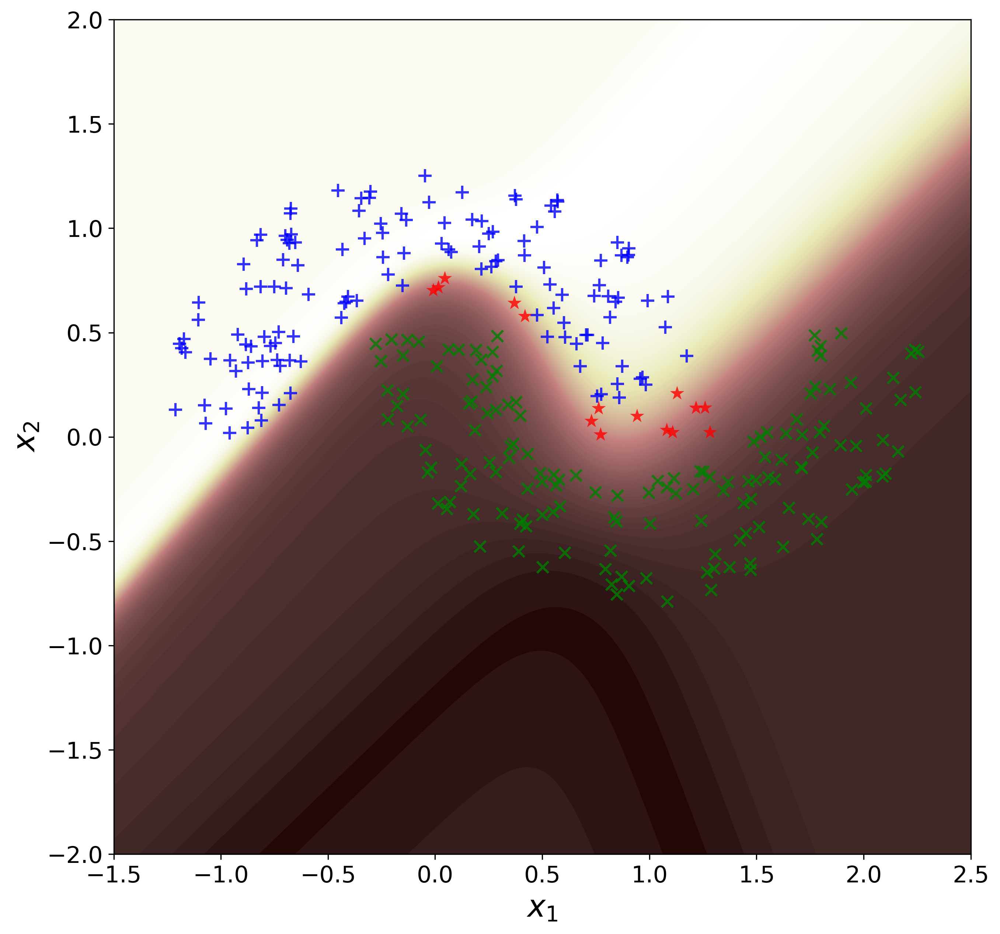

In [5]:
#P1_e
for name in dir():
    del globals()[name]
    
import numpy as np
import numpy.matlib
import matplotlib.pyplot as plt
import time

def trainMLP(X,D,H,eta,alpha,epochMax,MSETarget):
    a = 1.7159
    b = 2/3.
    [p, N] = np.shape(np.array(X))                 #dimension of input vector and number of training data pts
#     m = len(D)                                  #number of output neurons
    m = 1                                  #number of output neurons
    bias = -1                                      #bias value
    Wh=[]
    WhAnt=[]
    X = np.concatenate([bias*np.ones([1,N]),X ],axis=0)                  #add zero'th order terms
    for j in range(len(H)):
        if j ==0:
            Wh.append(np.random.rand(H[j],p+1))                          #initialize first hidden layer weights
            WhAnt.append(np.zeros([H[j],p+1]))                      #initialize variable for weight correction using momentum 
        else:
            Wh.append( np.random.rand(H[j],H[j-1]+1)  ) #initialize hidden layer weights
            WhAnt.append(np.zeros([H[j],H[j-1]+1]) )                #initialize variable for weight correction using momentum 
    Wo = np.random.rand(m,H[-1]+1)                                 #initialize output layer weights
    WoAnt = np.zeros([m,H[-1]+1])                            #initialize variable for weight correction using momentum
    MSETemp = np.zeros([epochMax,1])                   #allocate memory for MSE error for each epoch
    for i in range(epochMax):
        O=[]
        for j in range(len(H)):               #%loop over each hidden layer
            if j==0:
                V = Wh[j]@X               #%weighted sum of inputs [1] Eqn(4.29/30)
            else:
                V = Wh[j]@O[j-1]          #%weighted sum of hidden inputs [1] Eqn(4.29/31)
            PHI = a * np.tanh(b*V)         #%activation function [1] Eqn(4.37)
            O.append(np.concatenate([bias*np.ones([1,N]),PHI],axis=0))   #%add zero'th order terms
        V = Wo@O[-1]                 #%weighted sum of inputs [1] Eqn(4.29)
        Y = a * np.tanh(b*V)       #%activation function [1] Eqn(4.37)
        E = D - Y                  #%calclate error
        mse = np.mean(E**2)    #%calculate mean square error
        MSETemp[i,0] = mse           #%save mse
        #%DISPLAY PROGRESS, BREAK IF ERROR CONSTRAINT MET
#         print('epoch = ' +str(i)+ ' mse = ' +str(mse))
        if (mse < MSETarget):
            MSE = MSETemp
            return(Wh,Wo,MSE)
        PHI_PRMo = b/a *(a-Y)*(a+Y)   #%derivative of activation function [1] Eqn(4.38)
        dGo = E * PHI_PRMo                 #%local gradient [1] Eqn(4.35/39)
        DWo = dGo@O[-1].T                    #%non-scaled weight correction [1] Eqn(4.27)

        Wo = Wo + eta*DWo + alpha*WoAnt  #%weight correction including momentum term [1] Eqn(4.41)
        WoAnt = eta*DWo + alpha*WoAnt                         #%save weight correction for momentum calculation
        for j in np.arange(len(H))[::-1]:
            PHI_PRMh = b/a *(a-O[j])*(a+O[j])         #%derivative of activation function [1] Eqn(4.38)
            if j==(len(H)-1):
                dGh = PHI_PRMh * (Wo.T @ dGo)                   #%local gradient[1] Eqn(4.36/40)
            else:
                dGh = PHI_PRMh * (Wh[j+1].T @ np.matlib.repmat( dGo,Wh[j+1].shape[0],1 ) )         # %local gradient[1] Eqn(4.36/40)
            dGh = dGh[1:,:]                             #%dicard first row of local gradient (bias doesn't update)
            if j==0:
                DWh = dGh@X.T                            #%non-scaled weight correction [1] Eqn(4.27/30)
            else:
                DWh = dGh@O[j-1].T                       #%non-scaled weight correction [1] Eqn(4.27/31)
            Wh[j] =Wh[j]+ eta*DWh + alpha*WhAnt[j]  # %weight correction including momentum term [1] Eqn(4.41)
            WhAnt[j] =eta*DWh + alpha*WhAnt[j]     #%save weight correction for momentum calculation
    MSE = MSETemp
    return(Wh,Wo,MSE)

def MLP(X,Wh,Wo):
    a = 1.7159
    b = 2/3.
    N = len(X[0,:])               #%number of training data pts
    bias = -1                  # %initial bias value
    O=[]
    X = np.concatenate((bias*np.ones([1,N]) , X),axis=0)    #%add zero'th order terms
    H=[]
    for j in range(len(Wh)):
        H.append(len(Wh[j]))
    for j in range(len(H)):               #%loop over each hidden layer
        if j==0:
            V = Wh[j]@X               #%weighted sum of inputs [1] Eqn(4.29/30)
        else:
            V = Wh[j]@O[j-1]          #%weighted sum of hidden inputs [1] Eqn(4.29/31)
        
        PHI = a * np.tanh(b*V)     #%acivation function [1] Eqn(4.37)
        O.append( np.concatenate((bias*np.ones([1,N]),PHI),axis=0))   #%add zero'th order terms
    V = Wo@O[-1]            #%weighted sum of inputs [1] Eqn(4.29)
    Y = a * np.tanh(b*V)    #%activation function [1] Eqn(4.37)
    return Y

def doublemoon(N,d,r,w):
    ro1=np.random.uniform(low=r-w/2,high=r+w/2,size=N//2)
    t1=np.random.uniform(low=0,high=np.pi,size=N//2)
    x1=ro1*np.cos(t1)
    y1=ro1*np.sin(t1)
    l1=np.ones((1,N//2))
    
    ro2=np.random.uniform(low=r-w/2,high=r+w/2,size=N//2)
    t2=np.random.uniform(low=np.pi,high=2*np.pi,size=N//2)
    x2=ro2*np.cos(t2)+r
    y2=ro2*np.sin(t2)-d
    l2=-1*np.ones((1,N//2))
    
    E=np.vstack((x1,y1,l1,x2,y2,l2))
    return E

start_time=time.time()

#Data parameter definition
N=300
r=1
w=0.6
d=-0.5
#NN parameters
H=[3,4,3]
eta=0.001
alpha=0.1
epochMax=2000
MSETarget=1e-12

numIter=20

MSE=np.zeros((epochMax,numIter))

#iterating the training process
for i in range(numIter):
    E=doublemoon(N,d,r,w)
    E=np.hstack((E[0:3,:],E[3:6,:]))
    # #shuffling
    # i=np.arange(N)
    # np.random.shuffle(i)
    # E=E[:,i]
    X=E[0:2,:]
    D=E[None,-1,:]
    NN=trainMLP(X,D,H,eta,alpha,epochMax,MSETarget)
    MSE[:,i,None]=NN[2]
#__________________________________________________
#P1_f

Wh=NN[0]
Wo=NN[1]

Y=MLP(X,Wh,Wo)
Y[Y>=0]=1
Y[Y<0]=-1

#indexing data according to lables
i1=np.squeeze(np.equal(Y+D,2*np.ones((Y.shape[0],1))))
i2=np.squeeze(np.equal(Y+D,-2*np.ones((Y.shape[0],1))))
i3=np.squeeze(np.equal(Y+D,np.zeros((Y.shape[0],1))))
#printing the grid
nn=500
nodes1=np.linspace(-1.5,2.5,nn)
nodes2=np.linspace(-2.0,2.0,nn)
x1, x2 = np.meshgrid(nodes1, nodes2)
NodeTag=np.zeros((nn,nn))
crd=np.stack((x1,x2),axis=2)
crd=np.reshape(crd,(nn**2,2),order='C')
crd=crd.T
y1=MLP(crd,Wh,Wo)
y1=np.reshape(y1,(nn,nn))


print("--- %s seconds ---" % (time.time() - start_time))

fig1=plt.figure(figsize=[10,5])
plt.plot(np.arange(epochMax),np.mean(MSE,axis=1),c="b")
plt.xlabel('epoch',fontsize=20)
plt.ylabel('MSE',fontsize=20)
plt.xticks(fontsize=15)
plt.yticks(fontsize=15)
plt.grid('True',linestyle='--', linewidth=1)
plt.show(fig1)
# fig1.savefig('p1_e.svg',format='svg')
#plotting
fig2=plt.figure(figsize=[10,10],dpi=300)
plt.contourf(x1,x2,y1,150,cmap='pink', linewidths=3,linestyles='solid')
plt.scatter(X[0,i1], X[1,i1], alpha=0.8,marker='+', c='b', edgecolors='none', s=75)
plt.scatter(X[0,i2], X[1,i2], alpha=0.8,marker='x', c='g', edgecolors='none', s=55)
plt.scatter(X[0,i3], X[1,i3], alpha=0.8,marker='*', c='r', edgecolors='none', s=95)
plt.axis([-1.5,2.5,-2.0,2.0])
plt.xlabel('$x_1$',fontsize=20)
plt.ylabel('$x_2$',fontsize=20)
plt.xticks(fontsize=15)
plt.yticks(fontsize=15)
plt.show(fig2)
# fig2.savefig('p1_f.svg',format='svg')


--- 4.6619343757629395 seconds ---


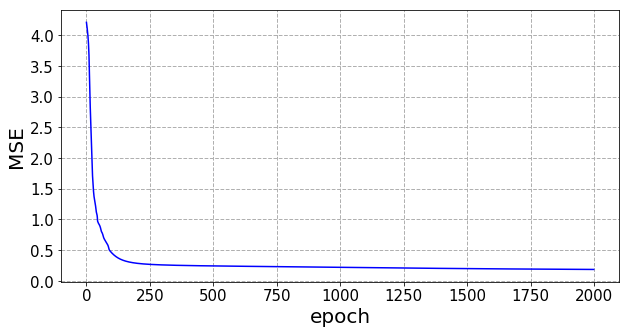

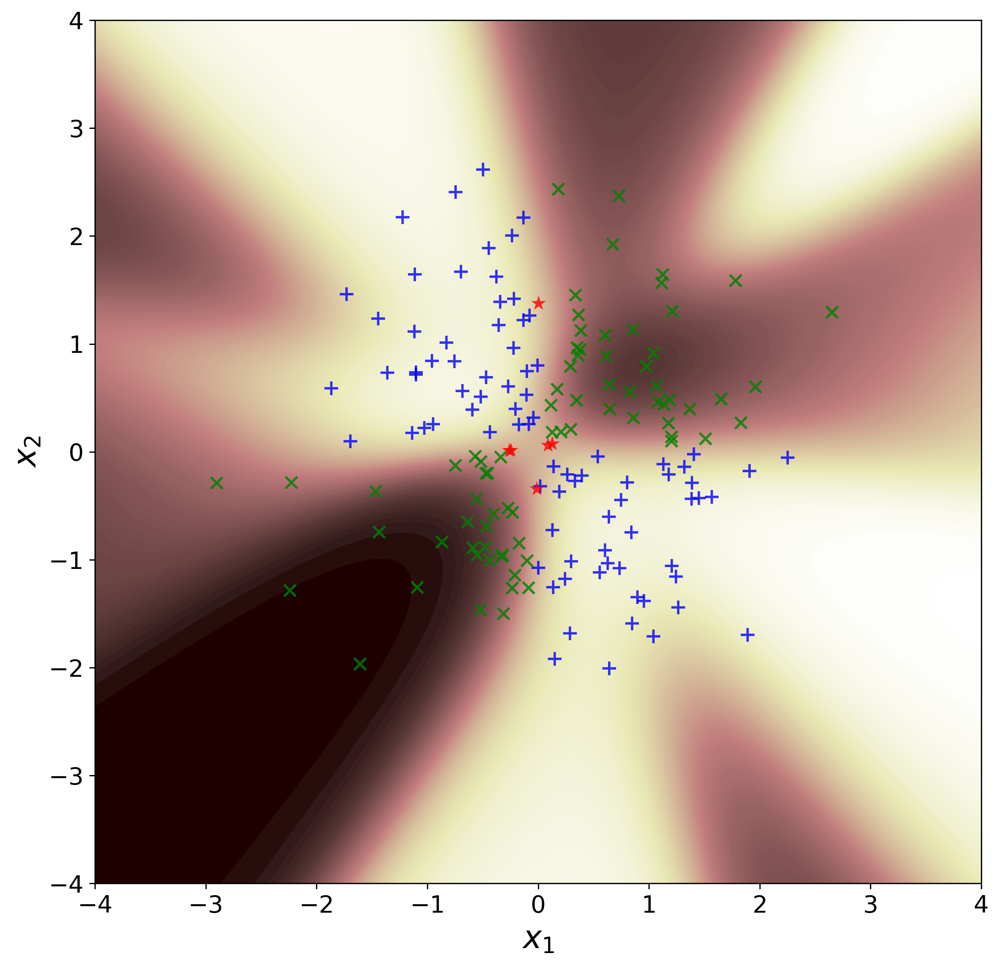

In [6]:
#P2_a
for name in dir():
    del globals()[name]
    
import numpy as np
import numpy.matlib
import matplotlib.pyplot as plt
import time

def trainMLP(X,D,H,eta,alpha,epochMax,MSETarget):
    a = 1.7159
    b = 2/3.
    [p, N] = np.shape(np.array(X))                 #dimension of input vector and number of training data pts
#     m = len(D)                                  #number of output neurons
    m = 1                                  #number of output neurons
    bias = -1                                      #bias value
    Wh=[]
    WhAnt=[]
    X = np.concatenate([bias*np.ones([1,N]),X ],axis=0)                  #add zero'th order terms
    for j in range(len(H)):
        if j ==0:
            Wh.append(np.random.rand(H[j],p+1))                          #initialize first hidden layer weights
            WhAnt.append(np.zeros([H[j],p+1]))                      #initialize variable for weight correction using momentum 
        else:
            Wh.append( np.random.rand(H[j],H[j-1]+1)  ) #initialize hidden layer weights
            WhAnt.append(np.zeros([H[j],H[j-1]+1]) )                #initialize variable for weight correction using momentum 
    Wo = np.random.rand(m,H[-1]+1)                                 #initialize output layer weights
    WoAnt = np.zeros([m,H[-1]+1])                            #initialize variable for weight correction using momentum
    MSETemp = np.zeros([epochMax,1])                   #allocate memory for MSE error for each epoch
    for i in range(epochMax):
        O=[]
        for j in range(len(H)):               #%loop over each hidden layer
            if j==0:
                V = Wh[j]@X               #%weighted sum of inputs [1] Eqn(4.29/30)
            else:
                V = Wh[j]@O[j-1]          #%weighted sum of hidden inputs [1] Eqn(4.29/31)
            PHI = a * np.tanh(b*V)         #%activation function [1] Eqn(4.37)
            O.append(np.concatenate([bias*np.ones([1,N]),PHI],axis=0))   #%add zero'th order terms
        V = Wo@O[-1]                 #%weighted sum of inputs [1] Eqn(4.29)
        Y = a * np.tanh(b*V)       #%activation function [1] Eqn(4.37)
        E = D - Y                  #%calclate error
        mse = np.mean(E**2)    #%calculate mean square error
        MSETemp[i,0] = mse           #%save mse
        #%DISPLAY PROGRESS, BREAK IF ERROR CONSTRAINT MET
#         print('epoch = ' +str(i)+ ' mse = ' +str(mse))
        if (mse < MSETarget):
            MSE = MSETemp
            return(Wh,Wo,MSE)
        PHI_PRMo = b/a *(a-Y)*(a+Y)   #%derivative of activation function [1] Eqn(4.38)
        dGo = E * PHI_PRMo                 #%local gradient [1] Eqn(4.35/39)
        DWo = dGo@O[-1].T                    #%non-scaled weight correction [1] Eqn(4.27)

        Wo = Wo + eta*DWo + alpha*WoAnt  #%weight correction including momentum term [1] Eqn(4.41)
        WoAnt = eta*DWo + alpha*WoAnt                         #%save weight correction for momentum calculation
        for j in np.arange(len(H))[::-1]:
            PHI_PRMh = b/a *(a-O[j])*(a+O[j])         #%derivative of activation function [1] Eqn(4.38)
            if j==(len(H)-1):
                dGh = PHI_PRMh * (Wo.T @ dGo)                   #%local gradient[1] Eqn(4.36/40)
            else:
                dGh = PHI_PRMh * (Wh[j+1].T @ np.matlib.repmat( dGo,Wh[j+1].shape[0],1 ) )         # %local gradient[1] Eqn(4.36/40)
            dGh = dGh[1:,:]                             #%dicard first row of local gradient (bias doesn't update)
            if j==0:
                DWh = dGh@X.T                            #%non-scaled weight correction [1] Eqn(4.27/30)
            else:
                DWh = dGh@O[j-1].T                       #%non-scaled weight correction [1] Eqn(4.27/31)
            Wh[j] =Wh[j]+ eta*DWh + alpha*WhAnt[j]  # %weight correction including momentum term [1] Eqn(4.41)
            WhAnt[j] =eta*DWh + alpha*WhAnt[j]     #%save weight correction for momentum calculation
    MSE = MSETemp
    return(Wh,Wo,MSE)

def MLP(X,Wh,Wo):
    a = 1.7159
    b = 2/3.
    N = len(X[0,:])               #%number of training data pts
    bias = -1                  # %initial bias value
    O=[]
    X = np.concatenate((bias*np.ones([1,N]) , X),axis=0)    #%add zero'th order terms
    H=[]
    for j in range(len(Wh)):
        H.append(len(Wh[j]))
    for j in range(len(H)):               #%loop over each hidden layer
        if j==0:
            V = Wh[j]@X               #%weighted sum of inputs [1] Eqn(4.29/30)
        else:
            V = Wh[j]@O[j-1]          #%weighted sum of hidden inputs [1] Eqn(4.29/31)
        
        PHI = a * np.tanh(b*V)     #%acivation function [1] Eqn(4.37)
        O.append( np.concatenate((bias*np.ones([1,N]),PHI),axis=0))   #%add zero'th order terms
    V = Wo@O[-1]            #%weighted sum of inputs [1] Eqn(4.29)
    Y = a * np.tanh(b*V)    #%activation function [1] Eqn(4.37)
    return Y

def gaussX(N,v):
    E1=np.sqrt(v)*np.random.randn(2,N//2)
    E2=np.sqrt(v)*np.random.randn(2,N//2)
    i=E1[0,:]*E1[1,:]
    E1=E1[:,i<0]
    l1=np.ones((1,E1.shape[1]))
    E1=np.vstack((E1,l1))
    i=E2[0,:]*E2[1,:]
    E2=E2[:,i>0]
    l2=-1*np.ones((1,E2.shape[1]))
    E2=np.vstack((E2,l2))
    E=np.hstack((E1,E2))
    return E

start_time=time.time()

#Data parameter definition
N=300
v=1
#NN parameters
H=[15]
eta=0.001
alpha=0.1
epochMax=2000
MSETarget=1e-12

numIter=20

MSE=np.zeros((epochMax,numIter))

#iterating the training process
for i in range(numIter):
    E=gaussX(N,v)
    # #shuffling
    # i=np.arange(N)
    # np.random.shuffle(i)
    # E=E[:,i]
    X=E[0:2,:]
    D=E[None,-1,:]
    NN=trainMLP(X,D,H,eta,alpha,epochMax,MSETarget)
    MSE[:,i,None]=NN[2]
#__________________________________________________
#P2_b

Wh=NN[0]
Wo=NN[1]

Y=MLP(X,Wh,Wo)
Y[Y>=0]=1
Y[Y<0]=-1

#indexing data according to lables
i1=np.squeeze(np.equal(Y+D,2*np.ones((Y.shape[0],1))))
i2=np.squeeze(np.equal(Y+D,-2*np.ones((Y.shape[0],1))))
i3=np.squeeze(np.equal(Y+D,np.zeros((Y.shape[0],1))))
#printing the grid
nn=500
nodes=np.linspace(-4,4,nn)
x1, x2 = np.meshgrid(nodes, nodes)
NodeTag=np.zeros((nn,nn))
crd=np.stack((x1,x2),axis=2)
crd=np.reshape(crd,(nn**2,2),order='C')
crd=crd.T
y1=MLP(crd,Wh,Wo)
y1=np.reshape(y1,(nn,nn))

print("--- %s seconds ---" % (time.time() - start_time))

fig1=plt.figure(figsize=[10,5])
plt.plot(np.arange(epochMax),np.mean(MSE,axis=1),c="b")
plt.xlabel('epoch',fontsize=20)
plt.ylabel('MSE',fontsize=20)
plt.xticks(fontsize=15)
plt.yticks(fontsize=15)
plt.grid('True',linestyle='--', linewidth=1)
plt.show(fig1)
# fig1.savefig('p2_a.svg',format='svg')
#plotting
fig2=plt.figure(figsize=[10,10],dpi=300)
plt.contourf(x1,x2,y1,150,cmap='pink', linewidths=3,linestyles='solid')
plt.scatter(X[0,i1], X[1,i1], alpha=0.8,marker='+', c='b', edgecolors='none', s=75)
plt.scatter(X[0,i2], X[1,i2], alpha=0.8,marker='x', c='g', edgecolors='none', s=55)
plt.scatter(X[0,i3], X[1,i3], alpha=0.8,marker='*', c='r', edgecolors='none', s=95)
plt.axis([-4,4,-4,4])
plt.xlabel('$x_1$',fontsize=20)
plt.ylabel('$x_2$',fontsize=20)
plt.xticks(fontsize=15)
plt.yticks(fontsize=15)
plt.show(fig2)
# fig2.savefig('p2_b.svg',format='svg')


--- 6.510908365249634 seconds ---


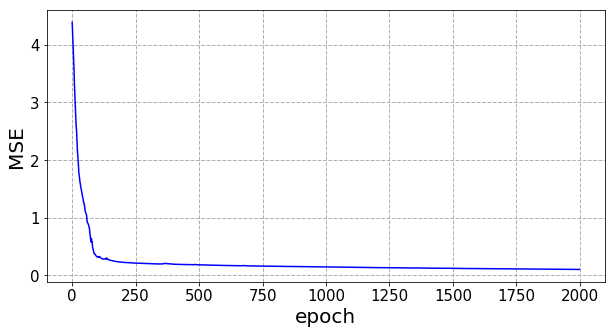

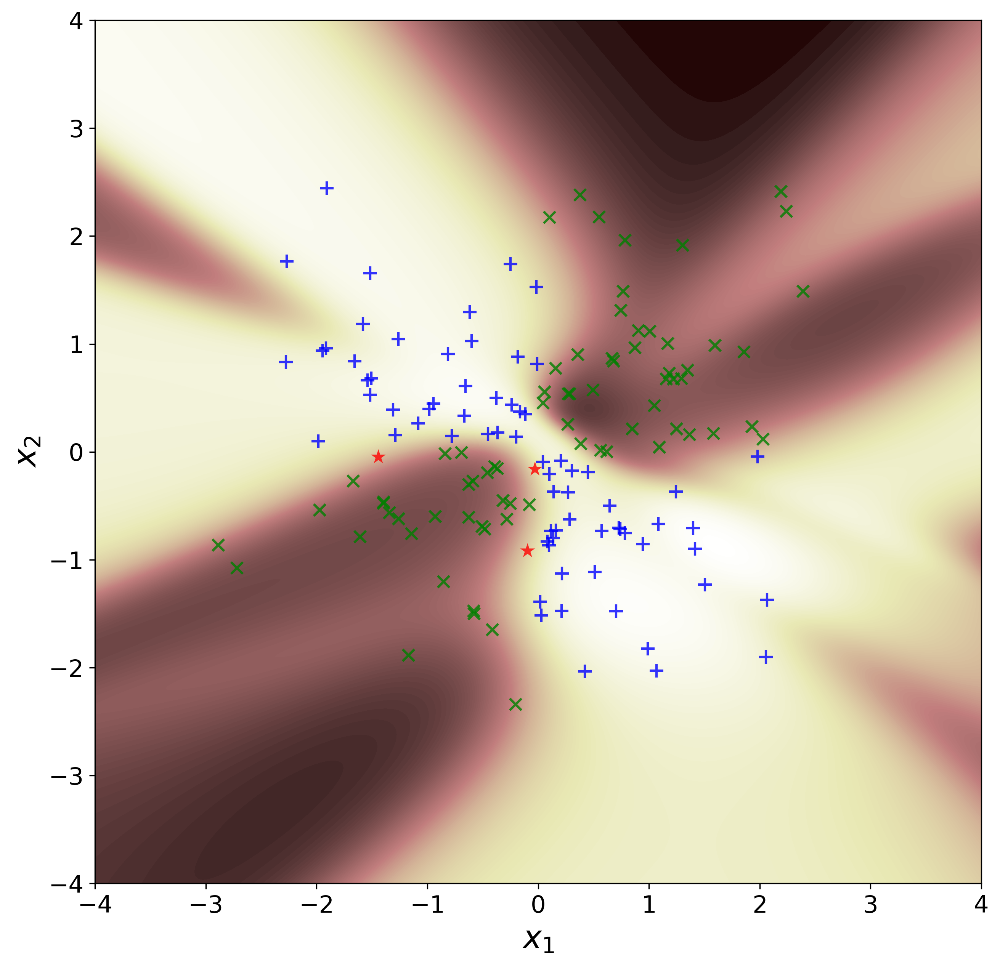

In [7]:
#P2_c
for name in dir():
    del globals()[name]
    
import numpy as np
import numpy.matlib
import matplotlib.pyplot as plt
import time

def trainMLP(X,D,H,eta,alpha,epochMax,MSETarget):
    a = 1.7159
    b = 2/3.
    [p, N] = np.shape(np.array(X))                 #dimension of input vector and number of training data pts
#     m = len(D)                                  #number of output neurons
    m = 1                                  #number of output neurons
    bias = -1                                      #bias value
    Wh=[]
    WhAnt=[]
    X = np.concatenate([bias*np.ones([1,N]),X ],axis=0)                  #add zero'th order terms
    for j in range(len(H)):
        if j ==0:
            Wh.append(np.random.rand(H[j],p+1))                          #initialize first hidden layer weights
            WhAnt.append(np.zeros([H[j],p+1]))                      #initialize variable for weight correction using momentum 
        else:
            Wh.append( np.random.rand(H[j],H[j-1]+1)  ) #initialize hidden layer weights
            WhAnt.append(np.zeros([H[j],H[j-1]+1]) )                #initialize variable for weight correction using momentum 
    Wo = np.random.rand(m,H[-1]+1)                                 #initialize output layer weights
    WoAnt = np.zeros([m,H[-1]+1])                            #initialize variable for weight correction using momentum
    MSETemp = np.zeros([epochMax,1])                   #allocate memory for MSE error for each epoch
    for i in range(epochMax):
        O=[]
        for j in range(len(H)):               #%loop over each hidden layer
            if j==0:
                V = Wh[j]@X               #%weighted sum of inputs [1] Eqn(4.29/30)
            else:
                V = Wh[j]@O[j-1]          #%weighted sum of hidden inputs [1] Eqn(4.29/31)
            PHI = a * np.tanh(b*V)         #%activation function [1] Eqn(4.37)
            O.append(np.concatenate([bias*np.ones([1,N]),PHI],axis=0))   #%add zero'th order terms
        V = Wo@O[-1]                 #%weighted sum of inputs [1] Eqn(4.29)
        Y = a * np.tanh(b*V)       #%activation function [1] Eqn(4.37)
        E = D - Y                  #%calclate error
        mse = np.mean(E**2)    #%calculate mean square error
        MSETemp[i,0] = mse           #%save mse
        #%DISPLAY PROGRESS, BREAK IF ERROR CONSTRAINT MET
#         print('epoch = ' +str(i)+ ' mse = ' +str(mse))
        if (mse < MSETarget):
            MSE = MSETemp
            return(Wh,Wo,MSE)
        PHI_PRMo = b/a *(a-Y)*(a+Y)   #%derivative of activation function [1] Eqn(4.38)
        dGo = E * PHI_PRMo                 #%local gradient [1] Eqn(4.35/39)
        DWo = dGo@O[-1].T                    #%non-scaled weight correction [1] Eqn(4.27)

        Wo = Wo + eta*DWo + alpha*WoAnt  #%weight correction including momentum term [1] Eqn(4.41)
        WoAnt = eta*DWo + alpha*WoAnt                         #%save weight correction for momentum calculation
        for j in np.arange(len(H))[::-1]:
            PHI_PRMh = b/a *(a-O[j])*(a+O[j])         #%derivative of activation function [1] Eqn(4.38)
            if j==(len(H)-1):
                dGh = PHI_PRMh * (Wo.T @ dGo)                   #%local gradient[1] Eqn(4.36/40)
            else:
                dGh = PHI_PRMh * (Wh[j+1].T @ np.matlib.repmat( dGo,Wh[j+1].shape[0],1 ) )         # %local gradient[1] Eqn(4.36/40)
            dGh = dGh[1:,:]                             #%dicard first row of local gradient (bias doesn't update)
            if j==0:
                DWh = dGh@X.T                            #%non-scaled weight correction [1] Eqn(4.27/30)
            else:
                DWh = dGh@O[j-1].T                       #%non-scaled weight correction [1] Eqn(4.27/31)
            Wh[j] =Wh[j]+ eta*DWh + alpha*WhAnt[j]  # %weight correction including momentum term [1] Eqn(4.41)
            WhAnt[j] =eta*DWh + alpha*WhAnt[j]     #%save weight correction for momentum calculation
    MSE = MSETemp
    return(Wh,Wo,MSE)

def MLP(X,Wh,Wo):
    a = 1.7159
    b = 2/3.
    N = len(X[0,:])               #%number of training data pts
    bias = -1                  # %initial bias value
    O=[]
    X = np.concatenate((bias*np.ones([1,N]) , X),axis=0)    #%add zero'th order terms
    H=[]
    for j in range(len(Wh)):
        H.append(len(Wh[j]))
    for j in range(len(H)):               #%loop over each hidden layer
        if j==0:
            V = Wh[j]@X               #%weighted sum of inputs [1] Eqn(4.29/30)
        else:
            V = Wh[j]@O[j-1]          #%weighted sum of hidden inputs [1] Eqn(4.29/31)
        
        PHI = a * np.tanh(b*V)     #%acivation function [1] Eqn(4.37)
        O.append( np.concatenate((bias*np.ones([1,N]),PHI),axis=0))   #%add zero'th order terms
    V = Wo@O[-1]            #%weighted sum of inputs [1] Eqn(4.29)
    Y = a * np.tanh(b*V)    #%activation function [1] Eqn(4.37)
    return Y

def gaussX(N,v):
    E1=np.sqrt(v)*np.random.randn(2,N//2)
    E2=np.sqrt(v)*np.random.randn(2,N//2)
    i=E1[0,:]*E1[1,:]
    E1=E1[:,i<0]
    l1=np.ones((1,E1.shape[1]))
    E1=np.vstack((E1,l1))
    i=E2[0,:]*E2[1,:]
    E2=E2[:,i>0]
    l2=-1*np.ones((1,E2.shape[1]))
    E2=np.vstack((E2,l2))
    E=np.hstack((E1,E2))
    return E

start_time=time.time()

#Data parameter definition
N=300
v=1
#NN parameters
H=[8,7]
eta=0.001
alpha=0.1
epochMax=2000
MSETarget=1e-12

numIter=20

MSE=np.zeros((epochMax,numIter))

#iterating the training process
for i in range(numIter):
    E=gaussX(N,v)
    X=E[0:2,:]
    D=E[None,-1,:]
    NN=trainMLP(X,D,H,eta,alpha,epochMax,MSETarget)
    MSE[:,i,None]=NN[2]
#__________________________________________________
#P2_d

Wh=NN[0]
Wo=NN[1]

Y=MLP(X,Wh,Wo)
Y[Y>=0]=1
Y[Y<0]=-1

#indexing data according to lables
i1=np.squeeze(np.equal(Y+D,2*np.ones((Y.shape[0],1))))
i2=np.squeeze(np.equal(Y+D,-2*np.ones((Y.shape[0],1))))
i3=np.squeeze(np.equal(Y+D,np.zeros((Y.shape[0],1))))
#printing the grid
nn=500
nodes=np.linspace(-4,4,nn)
x1, x2 = np.meshgrid(nodes, nodes)
NodeTag=np.zeros((nn,nn))
crd=np.stack((x1,x2),axis=2)
crd=np.reshape(crd,(nn**2,2),order='C')
crd=crd.T
y1=MLP(crd,Wh,Wo)
y1=np.reshape(y1,(nn,nn))

print("--- %s seconds ---" % (time.time() - start_time))

fig1=plt.figure(figsize=[10,5])
plt.plot(np.arange(epochMax),np.mean(MSE,axis=1),c="b")
plt.xlabel('epoch',fontsize=20)
plt.ylabel('MSE',fontsize=20)
plt.xticks(fontsize=15)
plt.yticks(fontsize=15)
plt.grid('True',linestyle='--', linewidth=1)
plt.show(fig1)
fig1.savefig('p2_c.svg',format='svg')
#plotting
fig2=plt.figure(figsize=[10,10],dpi=300)
plt.contourf(x1,x2,y1,150,cmap='pink', linewidths=3,linestyles='solid')
plt.scatter(X[0,i1], X[1,i1], alpha=0.8,marker='+', c='b', edgecolors='none', s=75)
plt.scatter(X[0,i2], X[1,i2], alpha=0.8,marker='x', c='g', edgecolors='none', s=55)
plt.scatter(X[0,i3], X[1,i3], alpha=0.8,marker='*', c='r', edgecolors='none', s=95)
plt.axis([-4,4,-4,4])
plt.xlabel('$x_1$',fontsize=20)
plt.ylabel('$x_2$',fontsize=20)
plt.xticks(fontsize=15)
plt.yticks(fontsize=15)
plt.show(fig2)
fig2.savefig('p2_d.svg',format='svg')


--- 7.910080909729004 seconds ---


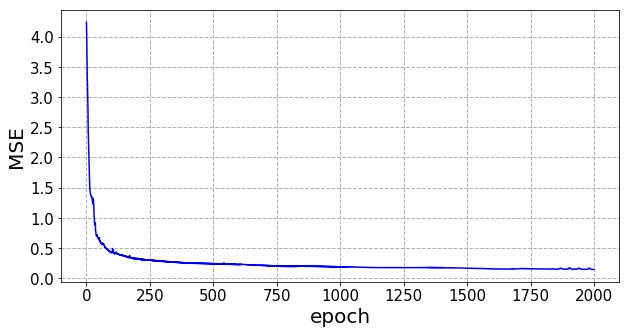

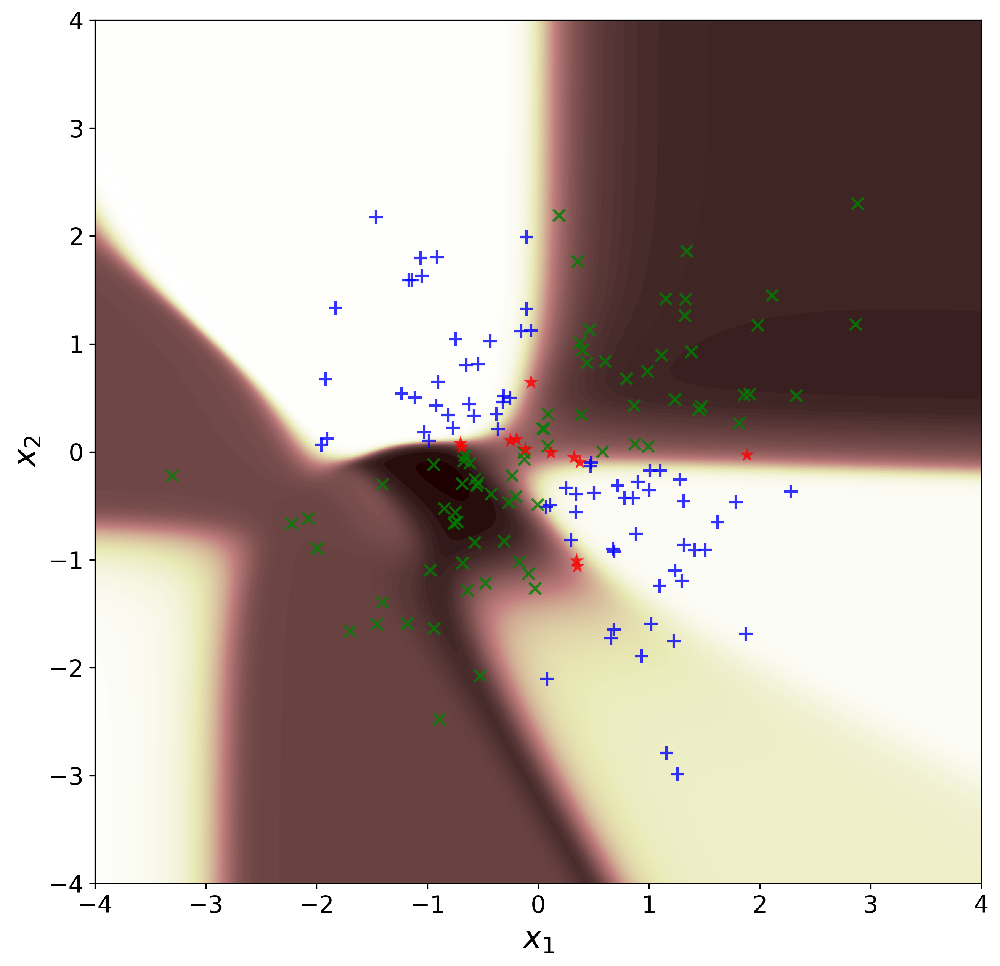

In [9]:
#P2_e
for name in dir():
    del globals()[name]
    
import numpy as np
import numpy.matlib
import matplotlib.pyplot as plt
import time

def trainMLP(X,D,H,eta,alpha,epochMax,MSETarget):
    a = 1.7159
    b = 2/3.
    [p, N] = np.shape(np.array(X))                 #dimension of input vector and number of training data pts
#     m = len(D)                                  #number of output neurons
    m = 1                                  #number of output neurons
    bias = -1                                      #bias value
    Wh=[]
    WhAnt=[]
    X = np.concatenate([bias*np.ones([1,N]),X ],axis=0)                  #add zero'th order terms
    for j in range(len(H)):
        if j ==0:
            Wh.append(np.random.rand(H[j],p+1))                          #initialize first hidden layer weights
            WhAnt.append(np.zeros([H[j],p+1]))                      #initialize variable for weight correction using momentum 
        else:
            Wh.append( np.random.rand(H[j],H[j-1]+1)  ) #initialize hidden layer weights
            WhAnt.append(np.zeros([H[j],H[j-1]+1]) )                #initialize variable for weight correction using momentum 
    Wo = np.random.rand(m,H[-1]+1)                                 #initialize output layer weights
    WoAnt = np.zeros([m,H[-1]+1])                            #initialize variable for weight correction using momentum
    MSETemp = np.zeros([epochMax,1])                   #allocate memory for MSE error for each epoch
    for i in range(epochMax):
        O=[]
        for j in range(len(H)):               #%loop over each hidden layer
            if j==0:
                V = Wh[j]@X               #%weighted sum of inputs [1] Eqn(4.29/30)
            else:
                V = Wh[j]@O[j-1]          #%weighted sum of hidden inputs [1] Eqn(4.29/31)
            PHI = a * np.tanh(b*V)         #%activation function [1] Eqn(4.37)
            O.append(np.concatenate([bias*np.ones([1,N]),PHI],axis=0))   #%add zero'th order terms
        V = Wo@O[-1]                 #%weighted sum of inputs [1] Eqn(4.29)
        Y = a * np.tanh(b*V)       #%activation function [1] Eqn(4.37)
        E = D - Y                  #%calclate error
        mse = np.mean(E**2)    #%calculate mean square error
        MSETemp[i,0] = mse           #%save mse
        #%DISPLAY PROGRESS, BREAK IF ERROR CONSTRAINT MET
#         print('epoch = ' +str(i)+ ' mse = ' +str(mse))
        if (mse < MSETarget):
            MSE = MSETemp
            return(Wh,Wo,MSE)
        PHI_PRMo = b/a *(a-Y)*(a+Y)   #%derivative of activation function [1] Eqn(4.38)
        dGo = E * PHI_PRMo                 #%local gradient [1] Eqn(4.35/39)
        DWo = dGo@O[-1].T                    #%non-scaled weight correction [1] Eqn(4.27)

        Wo = Wo + eta*DWo + alpha*WoAnt  #%weight correction including momentum term [1] Eqn(4.41)
        WoAnt = eta*DWo + alpha*WoAnt                         #%save weight correction for momentum calculation
        for j in np.arange(len(H))[::-1]:
            PHI_PRMh = b/a *(a-O[j])*(a+O[j])         #%derivative of activation function [1] Eqn(4.38)
            if j==(len(H)-1):
                dGh = PHI_PRMh * (Wo.T @ dGo)                   #%local gradient[1] Eqn(4.36/40)
            else:
                dGh = PHI_PRMh * (Wh[j+1].T @ np.matlib.repmat( dGo,Wh[j+1].shape[0],1 ) )         # %local gradient[1] Eqn(4.36/40)
            dGh = dGh[1:,:]                             #%dicard first row of local gradient (bias doesn't update)
            if j==0:
                DWh = dGh@X.T                            #%non-scaled weight correction [1] Eqn(4.27/30)
            else:
                DWh = dGh@O[j-1].T                       #%non-scaled weight correction [1] Eqn(4.27/31)
            Wh[j] =Wh[j]+ eta*DWh + alpha*WhAnt[j]  # %weight correction including momentum term [1] Eqn(4.41)
            WhAnt[j] =eta*DWh + alpha*WhAnt[j]     #%save weight correction for momentum calculation
    MSE = MSETemp
    return(Wh,Wo,MSE)

def MLP(X,Wh,Wo):
    a = 1.7159
    b = 2/3.
    N = len(X[0,:])               #%number of training data pts
    bias = -1                  # %initial bias value
    O=[]
    X = np.concatenate((bias*np.ones([1,N]) , X),axis=0)    #%add zero'th order terms
    H=[]
    for j in range(len(Wh)):
        H.append(len(Wh[j]))
    for j in range(len(H)):               #%loop over each hidden layer
        if j==0:
            V = Wh[j]@X               #%weighted sum of inputs [1] Eqn(4.29/30)
        else:
            V = Wh[j]@O[j-1]          #%weighted sum of hidden inputs [1] Eqn(4.29/31)
        
        PHI = a * np.tanh(b*V)     #%acivation function [1] Eqn(4.37)
        O.append( np.concatenate((bias*np.ones([1,N]),PHI),axis=0))   #%add zero'th order terms
    V = Wo@O[-1]            #%weighted sum of inputs [1] Eqn(4.29)
    Y = a * np.tanh(b*V)    #%activation function [1] Eqn(4.37)
    return Y

def gaussX(N,v):
    E1=np.sqrt(v)*np.random.randn(2,N//2)
    E2=np.sqrt(v)*np.random.randn(2,N//2)
    i=E1[0,:]*E1[1,:]
    E1=E1[:,i<0]
    l1=np.ones((1,E1.shape[1]))
    E1=np.vstack((E1,l1))
    i=E2[0,:]*E2[1,:]
    E2=E2[:,i>0]
    l2=-1*np.ones((1,E2.shape[1]))
    E2=np.vstack((E2,l2))
    E=np.hstack((E1,E2))
    return E

start_time=time.time()

#Data parameter definition
N=300
v=1
#NN parameters
H=[4,7,4]
eta=0.001
alpha=0.1
epochMax=2000
MSETarget=1e-12

numIter=20

MSE=np.zeros((epochMax,numIter))

#iterating the training process
for i in range(numIter):
    E=gaussX(N,v)
    # #shuffling
    # i=np.arange(N)
    # np.random.shuffle(i)
    # E=E[:,i]
    X=E[0:2,:]
    D=E[None,-1,:]
    NN=trainMLP(X,D,H,eta,alpha,epochMax,MSETarget)
    MSE[:,i,None]=NN[2]
#__________________________________________________
#P2_f

Wh=NN[0]
Wo=NN[1]

Y=MLP(X,Wh,Wo)
Y[Y>=0]=1
Y[Y<0]=-1

#indexing data according to lables
i1=np.squeeze(np.equal(Y+D,2*np.ones((Y.shape[0],1))))
i2=np.squeeze(np.equal(Y+D,-2*np.ones((Y.shape[0],1))))
i3=np.squeeze(np.equal(Y+D,np.zeros((Y.shape[0],1))))
#printing the grid
nn=500
nodes=np.linspace(-4,4,nn)
x1, x2 = np.meshgrid(nodes, nodes)
NodeTag=np.zeros((nn,nn))
crd=np.stack((x1,x2),axis=2)
crd=np.reshape(crd,(nn**2,2),order='C')
crd=crd.T
y1=MLP(crd,Wh,Wo)
y1=np.reshape(y1,(nn,nn))

print("--- %s seconds ---" % (time.time() - start_time))

fig1=plt.figure(figsize=[10,5])
plt.plot(np.arange(epochMax),np.mean(MSE,axis=1),c="b")
plt.xlabel('epoch',fontsize=20)
plt.ylabel('MSE',fontsize=20)
plt.xticks(fontsize=15)
plt.yticks(fontsize=15)
plt.grid('True',linestyle='--', linewidth=1)
plt.show(fig1)
# fig1.savefig('p2_e.svg',format='svg')
#plotting
fig2=plt.figure(figsize=[10,10],dpi=300)
plt.contourf(x1,x2,y1,150,cmap='pink', linewidths=3,linestyles='solid')
plt.scatter(X[0,i1], X[1,i1], alpha=0.8,marker='+', c='b', edgecolors='none', s=75)
plt.scatter(X[0,i2], X[1,i2], alpha=0.8,marker='x', c='g', edgecolors='none', s=55)
plt.scatter(X[0,i3], X[1,i3], alpha=0.8,marker='*', c='r', edgecolors='none', s=95)
plt.axis([-4,4,-4,4])
plt.xlabel('$x_1$',fontsize=20)
plt.ylabel('$x_2$',fontsize=20)
plt.xticks(fontsize=15)
plt.yticks(fontsize=15)
plt.show(fig2)
# fig2.savefig('p2_f.svg',format='svg')


--- 2.7197060585021973 seconds ---


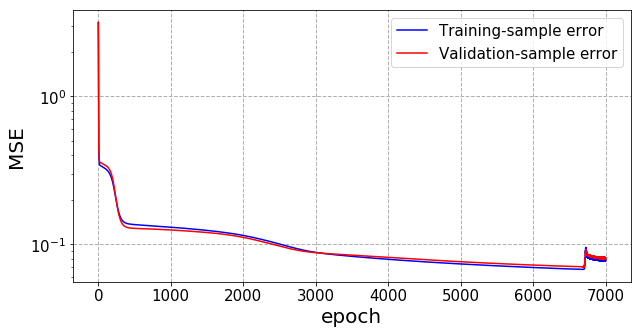

1.0


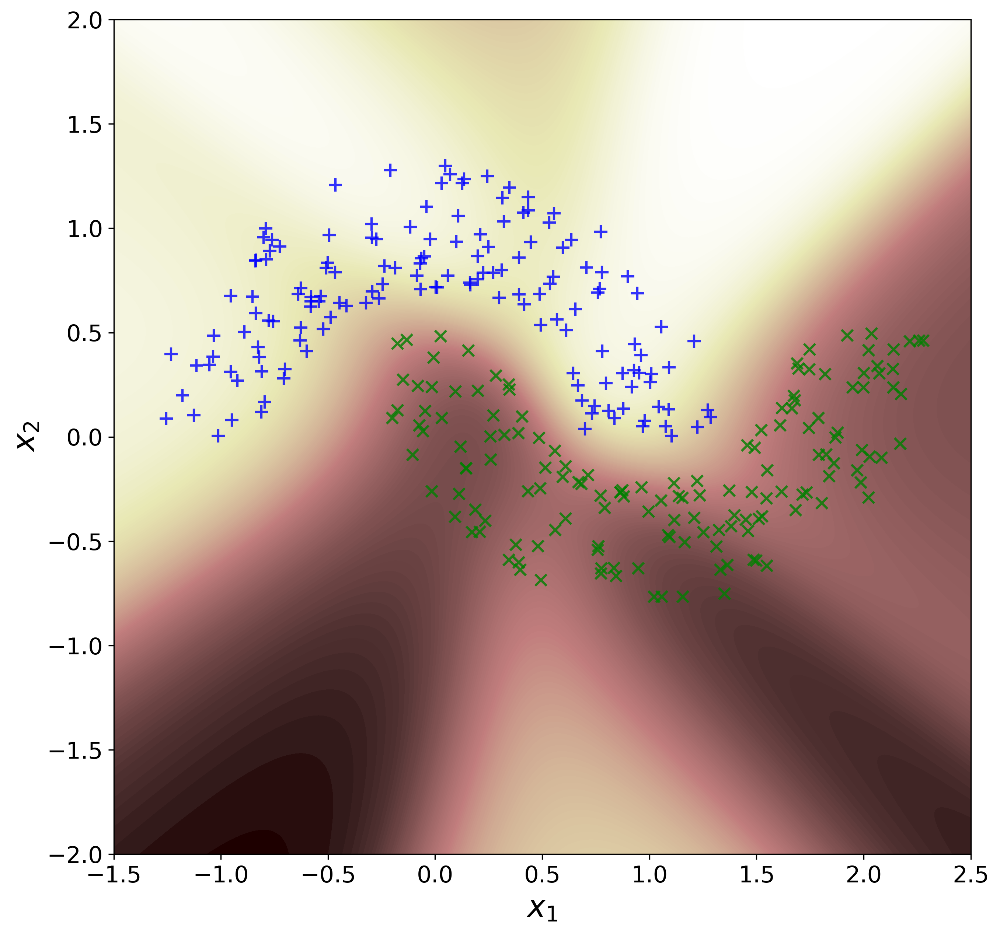

0.9976666666666667


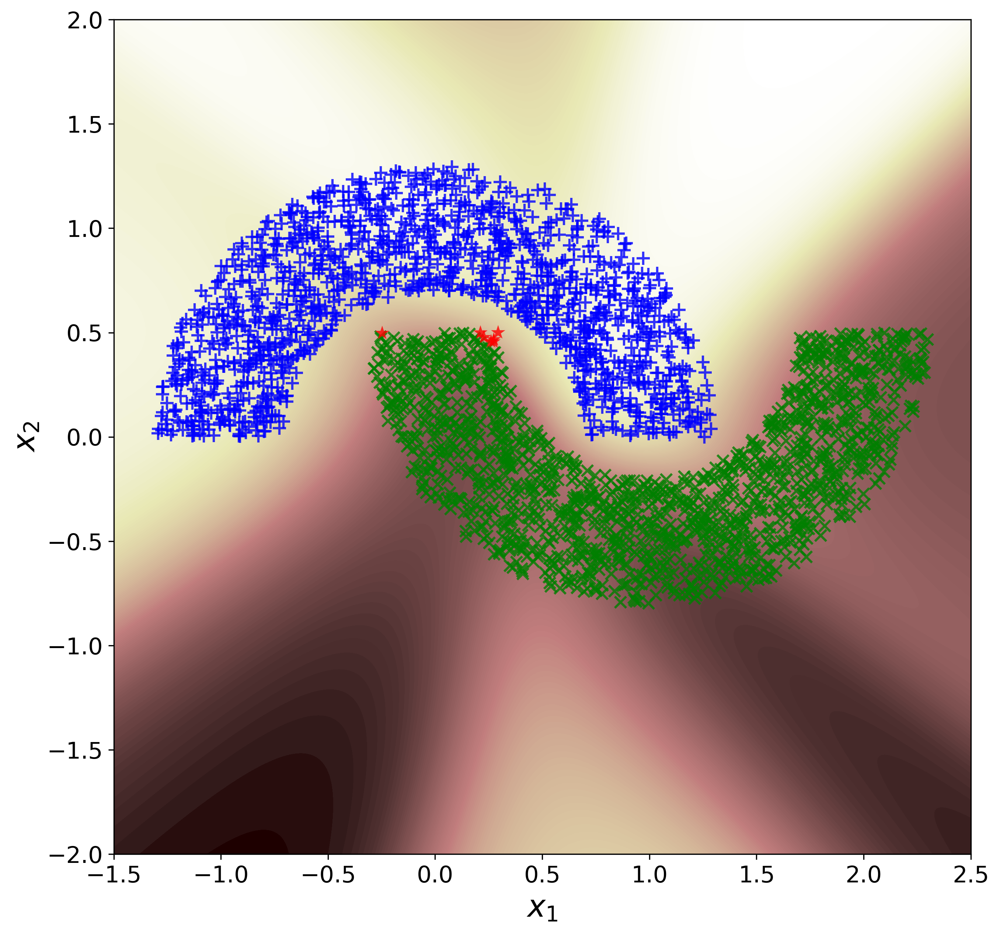

In [10]:
#P3_a
for name in dir():
    del globals()[name]
    
import numpy as np
import numpy.matlib
import matplotlib.pyplot as plt
import time

def trainMLP(X,D,Xv,Dv,H,eta,alpha,epochMax):
    a = 1.7159
    b = 2/3.
    [p, N] = np.shape(np.array(X))                 #dimension of input vector and number of training data pts
    [p, Nv] = np.shape(np.array(Xv))                 #dimension of input vector and number of training data pts
#     m = len(D)                                  #number of output neurons
    m = 1                                  #number of output neurons
    bias = -1                                      #bias value
    Wh=[]
    WhAnt=[]
    X = np.concatenate([bias*np.ones([1,N]),X ],axis=0)                  #add zero'th order terms
    Xv = np.concatenate([bias*np.ones([1,Nv]),Xv ],axis=0)                  #add zero'th order terms
    for j in range(len(H)):
        if j ==0:
            Wh.append(np.random.rand(H[j],p+1))                          #initialize first hidden layer weights
            WhAnt.append(np.zeros([H[j],p+1]))                      #initialize variable for weight correction using momentum 
        else:
            Wh.append( np.random.rand(H[j],H[j-1]+1)  ) #initialize hidden layer weights
            WhAnt.append(np.zeros([H[j],H[j-1]+1]) )                #initialize variable for weight correction using momentum 
    Wo = np.random.rand(m,H[-1]+1)                                 #initialize output layer weights
    WoAnt = np.zeros([m,H[-1]+1])                            #initialize variable for weight correction using momentum
    MSETemp = np.zeros([epochMax,1])                   #allocate memory for MSE error for each epoch
    MSEv = np.zeros([epochMax,1])                   #allocate memory for MSE error for each epoch
    for i in range(epochMax):
        O=[]
        for j in range(len(H)):               #%loop over each hidden layer
            if j==0:
                V = Wh[j]@Xv               #%weighted sum of inputs [1] Eqn(4.29/30)
            else:
                V = Wh[j]@O[j-1]          #%weighted sum of hidden inputs [1] Eqn(4.29/31)
            PHI = a * np.tanh(b*V)         #%activation function [1] Eqn(4.37)
            O.append(np.concatenate([bias*np.ones([1,Nv]),PHI],axis=0))   #%add zero'th order terms
        V = Wo@O[-1]                 #%weighted sum of inputs [1] Eqn(4.29)
        Y = a * np.tanh(b*V)       #%activation function [1] Eqn(4.37)
        E = Dv - Y                  #%calclate error
        mse = np.mean(E**2)    #%calculate mean square error
        MSEv[i,0] = mse           #%save mse
        O=[]
        for j in range(len(H)):               #%loop over each hidden layer
            if j==0:
                V = Wh[j]@X               #%weighted sum of inputs [1] Eqn(4.29/30)
            else:
                V = Wh[j]@O[j-1]          #%weighted sum of hidden inputs [1] Eqn(4.29/31)
            PHI = a * np.tanh(b*V)         #%activation function [1] Eqn(4.37)
            O.append(np.concatenate([bias*np.ones([1,N]),PHI],axis=0))   #%add zero'th order terms
        V = Wo@O[-1]                 #%weighted sum of inputs [1] Eqn(4.29)
        Y = a * np.tanh(b*V)       #%activation function [1] Eqn(4.37)
        E = D - Y                  #%calclate error
        mse = np.mean(E**2)    #%calculate mean square error
        MSETemp[i,0] = mse           #%save mse
        #%DISPLAY PROGRESS, BREAK IF ERROR CONSTRAINT MET
#         print('epoch = ' +str(i)+ ' mse = ' +str(mse))
#         if (mse < MSETarget):
#             MSE = MSETemp
#             return(Wh,Wo,MSE)
        PHI_PRMo = b/a *(a-Y)*(a+Y)   #%derivative of activation function [1] Eqn(4.38)
        dGo = E * PHI_PRMo                 #%local gradient [1] Eqn(4.35/39)
        DWo = dGo@O[-1].T                    #%non-scaled weight correction [1] Eqn(4.27)

        Wo = Wo + eta*DWo + alpha*WoAnt  #%weight correction including momentum term [1] Eqn(4.41)
        WoAnt = eta*DWo + alpha*WoAnt                         #%save weight correction for momentum calculation
        for j in np.arange(len(H))[::-1]:
            PHI_PRMh = b/a *(a-O[j])*(a+O[j])         #%derivative of activation function [1] Eqn(4.38)
            if j==(len(H)-1):
                dGh = PHI_PRMh * (Wo.T @ dGo)                   #%local gradient[1] Eqn(4.36/40)
            else:
                dGh = PHI_PRMh * (Wh[j+1].T @ np.matlib.repmat( dGo,Wh[j+1].shape[0],1 ) )         # %local gradient[1] Eqn(4.36/40)
            dGh = dGh[1:,:]                             #%dicard first row of local gradient (bias doesn't update)
            if j==0:
                DWh = dGh@X.T                            #%non-scaled weight correction [1] Eqn(4.27/30)
            else:
                DWh = dGh@O[j-1].T                       #%non-scaled weight correction [1] Eqn(4.27/31)
            Wh[j] =Wh[j]+ eta*DWh + alpha*WhAnt[j]  # %weight correction including momentum term [1] Eqn(4.41)
            WhAnt[j] =eta*DWh + alpha*WhAnt[j]     #%save weight correction for momentum calculation
        
        
        
    MSE = MSETemp
    return(Wh,Wo,MSE,MSEv)

def MLP(X,Wh,Wo):
    a = 1.7159
    b = 2/3.
    N = len(X[0,:])               #%number of training data pts
    bias = -1                  # %initial bias value
    O=[]
    X = np.concatenate((bias*np.ones([1,N]) , X),axis=0)    #%add zero'th order terms
    H=[]
    for j in range(len(Wh)):
        H.append(len(Wh[j]))
    for j in range(len(H)):               #%loop over each hidden layer
        if j==0:
            V = Wh[j]@X               #%weighted sum of inputs [1] Eqn(4.29/30)
        else:
            V = Wh[j]@O[j-1]          #%weighted sum of hidden inputs [1] Eqn(4.29/31)
        
        PHI = a * np.tanh(b*V)     #%acivation function [1] Eqn(4.37)
        O.append( np.concatenate((bias*np.ones([1,N]),PHI),axis=0))   #%add zero'th order terms
    V = Wo@O[-1]            #%weighted sum of inputs [1] Eqn(4.29)
    Y = a * np.tanh(b*V)    #%activation function [1] Eqn(4.37)
    return Y

def doublemoon(N,d,r,w):
    ro1=np.random.uniform(low=r-w/2,high=r+w/2,size=N//2)
    t1=np.random.uniform(low=0,high=np.pi,size=N//2)
    x1=ro1*np.cos(t1)
    y1=ro1*np.sin(t1)
    l1=np.ones((1,N//2))
    
    ro2=np.random.uniform(low=r-w/2,high=r+w/2,size=N//2)
    t2=np.random.uniform(low=np.pi,high=2*np.pi,size=N//2)
    x2=ro2*np.cos(t2)+r
    y2=ro2*np.sin(t2)-d
    l2=-1*np.ones((1,N//2))
    
    E=np.vstack((x1,y1,l1,x2,y2,l2))
    return E

start_time=time.time()

#Data parameter definition
Nt=300
Nv=3000
r=1
w=0.6
d=-0.5
#NN parameters
H=[10]
eta=0.001
alpha=0.1
epochMax=7000
MSETarget=1e-12

#iterating the training process
E=doublemoon(Nt,d,r,w)
E=np.hstack((E[0:3,:],E[3:6,:]))
Ev=doublemoon(Nv,d,r,w)
Ev=np.hstack((Ev[0:3,:],Ev[3:6,:]))

X=E[0:2,:]
D=E[None,-1,:]
Xv=Ev[0:2,:]
Dv=Ev[None,-1,:]
NN=trainMLP(X,D,Xv,Dv,H,eta,alpha,epochMax)

MSE=NN[2]
MSEv=NN[3]
print("--- %s seconds ---" % (time.time() - start_time))

fig1=plt.figure(figsize=[10,5])
plt.semilogy(np.arange(epochMax),MSE,c="b",label='Training-sample error')
plt.semilogy(np.arange(epochMax),MSEv,c="r",label='Validation-sample error')
plt.legend(fontsize=15)
plt.xlabel('epoch',fontsize=20)
plt.ylabel('MSE',fontsize=20)
plt.xticks(fontsize=15)
plt.yticks(fontsize=15)
plt.grid('True',linestyle='--', linewidth=1)
plt.show(fig1)
# fig1.savefig('p3_a1.svg',format='svg')

Stop=5000

NN=trainMLP(X,D,Xv,Dv,H,eta,alpha,Stop)

Wh=NN[0]
Wo=NN[1]

Y=MLP(X,Wh,Wo)
Y[Y>=0]=1
Y[Y<0]=-1

#indexing data according to lables
i1=np.squeeze(np.equal(Y+D,2*np.ones((Y.shape[0],1))))
i2=np.squeeze(np.equal(Y+D,-2*np.ones((Y.shape[0],1))))
i3=np.squeeze(np.equal(Y+D,np.zeros((Y.shape[0],1))))
#printing the grid
nn=500
nodes1=np.linspace(-1.5,2.5,nn)
nodes2=np.linspace(-2.0,2.0,nn)
x1, x2 = np.meshgrid(nodes1, nodes2)
NodeTag=np.zeros((nn,nn))
crd=np.stack((x1,x2),axis=2)
crd=np.reshape(crd,(nn**2,2),order='C')
crd=crd.T
y1=MLP(crd,Wh,Wo)
y1=np.reshape(y1,(nn,nn))

train_acc=(np.sum(i1*1)+np.sum(i2*1))/300
print(train_acc)
#plotting
fig2=plt.figure(figsize=[10,10],dpi=300)
plt.contourf(x1,x2,y1,150,cmap='pink', linewidths=3,linestyles='solid')
plt.scatter(X[0,i1], X[1,i1], alpha=0.8,marker='+', c='b', edgecolors='none', s=75)
plt.scatter(X[0,i2], X[1,i2], alpha=0.8,marker='x', c='g', edgecolors='none', s=55)
plt.scatter(X[0,i3], X[1,i3], alpha=0.8,marker='*', c='r', edgecolors='none', s=95)
plt.axis([-1.5,2.5,-2.0,2.0])
plt.xlabel('$x_1$',fontsize=20)
plt.ylabel('$x_2$',fontsize=20)
plt.xticks(fontsize=15)
plt.yticks(fontsize=15)
plt.show(fig2)
# fig2.savefig('p3_a2.svg',format='svg')

Y=MLP(Xv,Wh,Wo)
Y[Y>=0]=1
Y[Y<0]=-1

#indexing data according to lables
i1=np.squeeze(np.equal(Y+Dv,2*np.ones((Y.shape[0],1))))
i2=np.squeeze(np.equal(Y+Dv,-2*np.ones((Y.shape[0],1))))
i3=np.squeeze(np.equal(Y+Dv,np.zeros((Y.shape[0],1))))
#printing the grid
nn=500
nodes1=np.linspace(-1.5,2.5,nn)
nodes2=np.linspace(-2.0,2.0,nn)
x1, x2 = np.meshgrid(nodes1, nodes2)
NodeTag=np.zeros((nn,nn))
crd=np.stack((x1,x2),axis=2)
crd=np.reshape(crd,(nn**2,2),order='C')
crd=crd.T
y1=MLP(crd,Wh,Wo)
y1=np.reshape(y1,(nn,nn))

test_acc=(np.sum(i1*1)+np.sum(i2*1))/3000
print(test_acc)
#plotting
fig2=plt.figure(figsize=[10,10],dpi=300)
plt.contourf(x1,x2,y1,150,cmap='pink', linewidths=3,linestyles='solid')
plt.scatter(Xv[0,i1], Xv[1,i1], alpha=0.8,marker='+', c='b', edgecolors='none', s=75)
plt.scatter(Xv[0,i2], Xv[1,i2], alpha=0.8,marker='x', c='g', edgecolors='none', s=55)
plt.scatter(Xv[0,i3], Xv[1,i3], alpha=0.8,marker='*', c='r', edgecolors='none', s=95)
plt.axis([-1.5,2.5,-2.0,2.0])
plt.xlabel('$x_1$',fontsize=20)
plt.ylabel('$x_2$',fontsize=20)
plt.xticks(fontsize=15)
plt.yticks(fontsize=15)
plt.show(fig2)
# fig2.savefig('p3_a3.svg',format='svg')

--- 2.0868403911590576 seconds ---


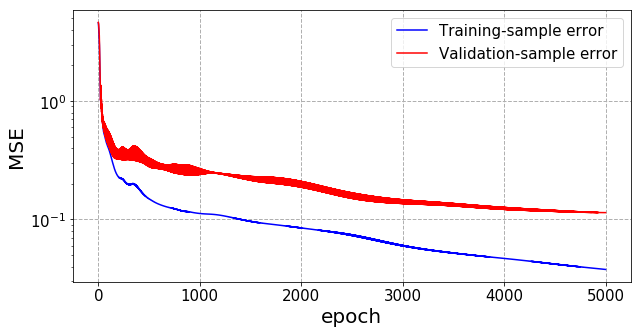

0.9869281045751634


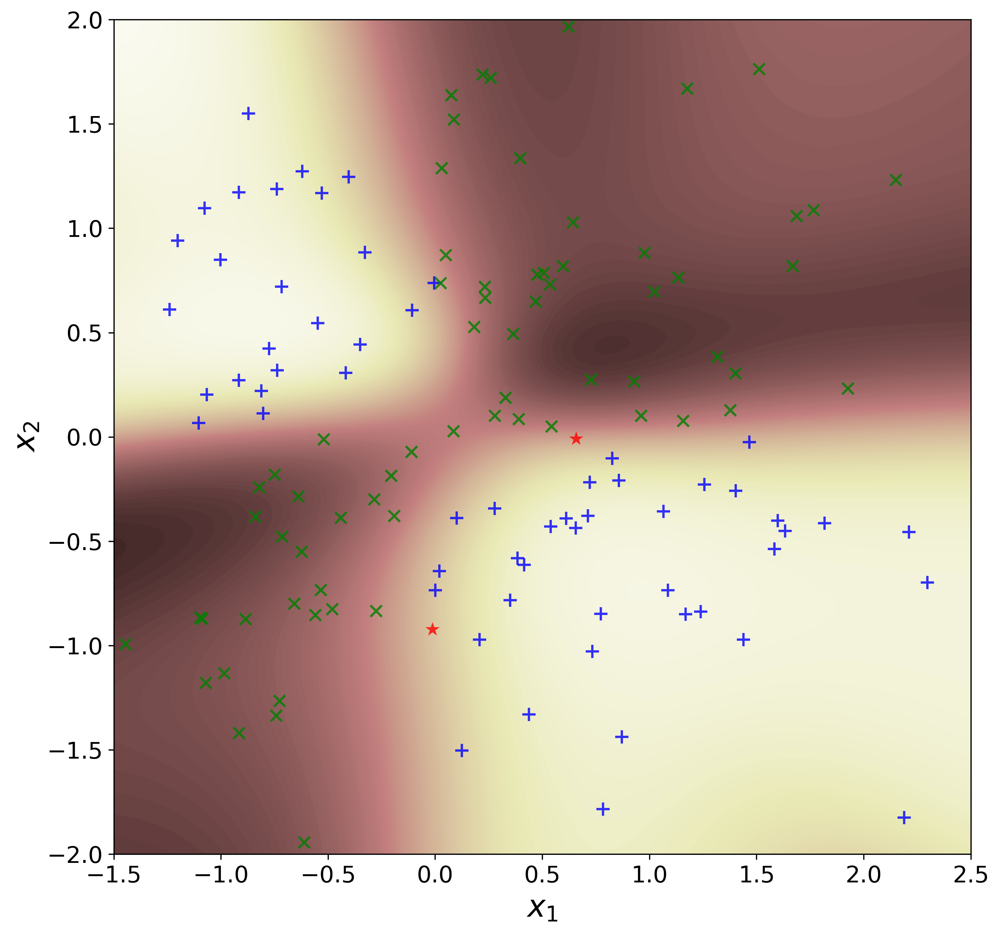

0.933243425488874


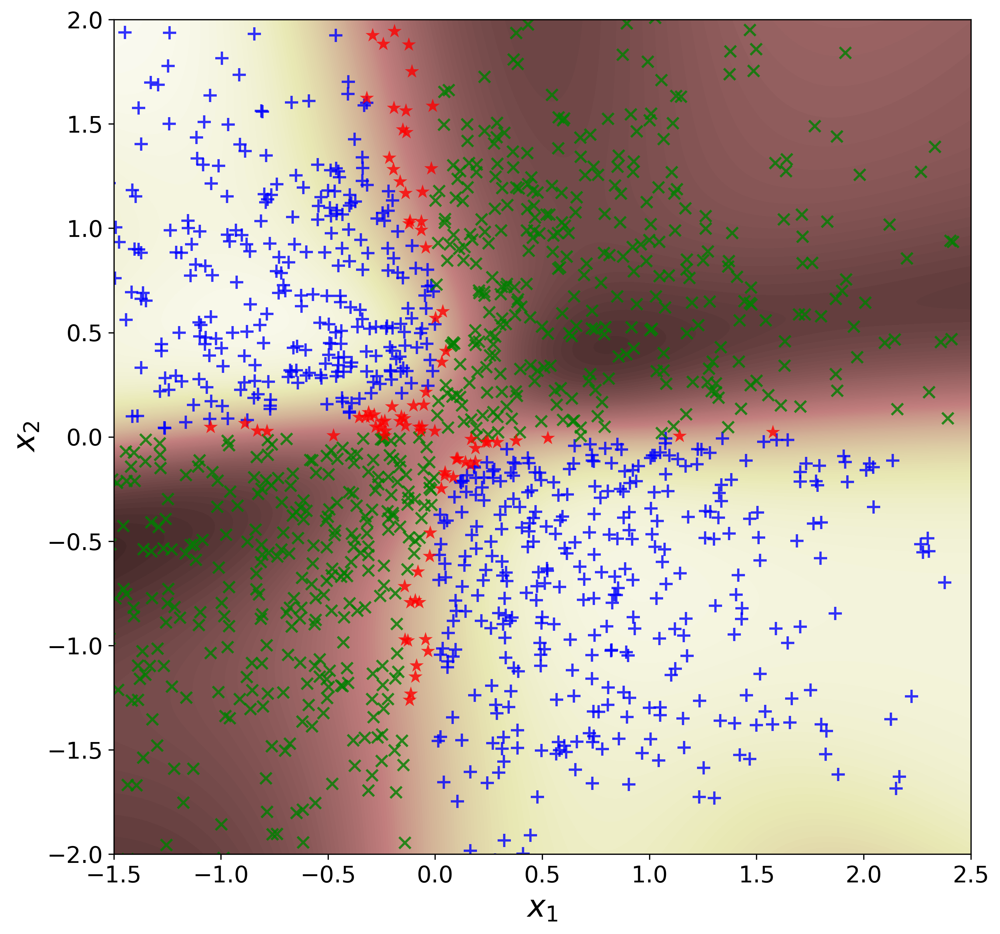

In [11]:
#P3_b
for name in dir():
    del globals()[name]
    
import numpy as np
import numpy.matlib
import matplotlib.pyplot as plt
import time

def trainMLP(X,D,Xv,Dv,H,eta,alpha,epochMax):
    a = 1.7159
    b = 2/3.
    [p, N] = np.shape(np.array(X))                 #dimension of input vector and number of training data pts
    [p, Nv] = np.shape(np.array(Xv))                 #dimension of input vector and number of training data pts
#     m = len(D)                                  #number of output neurons
    m = 1                                  #number of output neurons
    bias = -1                                      #bias value
    Wh=[]
    WhAnt=[]
    X = np.concatenate([bias*np.ones([1,N]),X ],axis=0)                  #add zero'th order terms
    Xv = np.concatenate([bias*np.ones([1,Nv]),Xv ],axis=0)                  #add zero'th order terms
    for j in range(len(H)):
        if j ==0:
            Wh.append(np.random.rand(H[j],p+1))                          #initialize first hidden layer weights
            WhAnt.append(np.zeros([H[j],p+1]))                      #initialize variable for weight correction using momentum 
        else:
            Wh.append( np.random.rand(H[j],H[j-1]+1)  ) #initialize hidden layer weights
            WhAnt.append(np.zeros([H[j],H[j-1]+1]) )                #initialize variable for weight correction using momentum 
    Wo = np.random.rand(m,H[-1]+1)                                 #initialize output layer weights
    WoAnt = np.zeros([m,H[-1]+1])                            #initialize variable for weight correction using momentum
    MSETemp = np.zeros([epochMax,1])                   #allocate memory for MSE error for each epoch
    MSEv = np.zeros([epochMax,1])                   #allocate memory for MSE error for each epoch
    for i in range(epochMax):
        O=[]
        for j in range(len(H)):               #%loop over each hidden layer for validation set
            if j==0:
                V = Wh[j]@Xv               #%weighted sum of inputs [1] Eqn(4.29/30)
            else:
                V = Wh[j]@O[j-1]          #%weighted sum of hidden inputs [1] Eqn(4.29/31)
            PHI = a * np.tanh(b*V)         #%activation function [1] Eqn(4.37)
            O.append(np.concatenate([bias*np.ones([1,Nv]),PHI],axis=0))   #%add zero'th order terms
        V = Wo@O[-1]                 #%weighted sum of inputs [1] Eqn(4.29)
        Y = a * np.tanh(b*V)       #%activation function [1] Eqn(4.37)
        E = Dv - Y                  #%calclate error
        mse = np.mean(E**2)    #%calculate mean square error
        MSEv[i,0] = mse           #%save mse
        O=[]
        for j in range(len(H)):               #%loop over each hidden layer for test set and training
            if j==0:
                V = Wh[j]@X               #%weighted sum of inputs [1] Eqn(4.29/30)
            else:
                V = Wh[j]@O[j-1]          #%weighted sum of hidden inputs [1] Eqn(4.29/31)
            PHI = a * np.tanh(b*V)         #%activation function [1] Eqn(4.37)
            O.append(np.concatenate([bias*np.ones([1,N]),PHI],axis=0))   #%add zero'th order terms
        V = Wo@O[-1]                 #%weighted sum of inputs [1] Eqn(4.29)
        Y = a * np.tanh(b*V)       #%activation function [1] Eqn(4.37)
        E = D - Y                  #%calclate error
        mse = np.mean(E**2)    #%calculate mean square error
        MSETemp[i,0] = mse           #%save mse
        #%DISPLAY PROGRESS, BREAK IF ERROR CONSTRAINT MET
#         print('epoch = ' +str(i)+ ' mse = ' +str(mse))
#         if (mse < MSETarget):
#             MSE = MSETemp
#             return(Wh,Wo,MSE)
        PHI_PRMo = b/a *(a-Y)*(a+Y)   #%derivative of activation function [1] Eqn(4.38)
        dGo = E * PHI_PRMo                 #%local gradient [1] Eqn(4.35/39)
        DWo = dGo@O[-1].T                    #%non-scaled weight correction [1] Eqn(4.27)

        Wo = Wo + eta*DWo + alpha*WoAnt  #%weight correction including momentum term [1] Eqn(4.41)
        WoAnt = eta*DWo + alpha*WoAnt                         #%save weight correction for momentum calculation
        for j in np.arange(len(H))[::-1]:
            PHI_PRMh = b/a *(a-O[j])*(a+O[j])         #%derivative of activation function [1] Eqn(4.38)
            if j==(len(H)-1):
                dGh = PHI_PRMh * (Wo.T @ dGo)                   #%local gradient[1] Eqn(4.36/40)
            else:
                dGh = PHI_PRMh * (Wh[j+1].T @ np.matlib.repmat( dGo,Wh[j+1].shape[0],1 ) )         # %local gradient[1] Eqn(4.36/40)
            dGh = dGh[1:,:]                             #%dicard first row of local gradient (bias doesn't update)
            if j==0:
                DWh = dGh@X.T                            #%non-scaled weight correction [1] Eqn(4.27/30)
            else:
                DWh = dGh@O[j-1].T                       #%non-scaled weight correction [1] Eqn(4.27/31)
            Wh[j] =Wh[j]+ eta*DWh + alpha*WhAnt[j]  # %weight correction including momentum term [1] Eqn(4.41)
            WhAnt[j] =eta*DWh + alpha*WhAnt[j]     #%save weight correction for momentum calculation
        
        
        
    MSE = MSETemp
    return(Wh,Wo,MSE,MSEv)

def MLP(X,Wh,Wo):
    a = 1.7159
    b = 2/3.
    N = len(X[0,:])               #%number of training data pts
    bias = -1                  # %initial bias value
    O=[]
    X = np.concatenate((bias*np.ones([1,N]) , X),axis=0)    #%add zero'th order terms
    H=[]
    for j in range(len(Wh)):
        H.append(len(Wh[j]))
    for j in range(len(H)):               #%loop over each hidden layer
        if j==0:
            V = Wh[j]@X               #%weighted sum of inputs [1] Eqn(4.29/30)
        else:
            V = Wh[j]@O[j-1]          #%weighted sum of hidden inputs [1] Eqn(4.29/31)
        
        PHI = a * np.tanh(b*V)     #%acivation function [1] Eqn(4.37)
        O.append( np.concatenate((bias*np.ones([1,N]),PHI),axis=0))   #%add zero'th order terms
    V = Wo@O[-1]            #%weighted sum of inputs [1] Eqn(4.29)
    Y = a * np.tanh(b*V)    #%activation function [1] Eqn(4.37)
    return Y

def gaussX(N,v):
    E1=np.sqrt(v)*np.random.randn(2,N//2)
    E2=np.sqrt(v)*np.random.randn(2,N//2)
    i=E1[0,:]*E1[1,:]
    E1=E1[:,i<0]
    l1=np.ones((1,E1.shape[1]))
    E1=np.vstack((E1,l1))
    i=E2[0,:]*E2[1,:]
    E2=E2[:,i>0]
    l2=-1*np.ones((1,E2.shape[1]))
    E2=np.vstack((E2,l2))
    E=np.hstack((E1,E2))
    return E

start_time=time.time()

#Data parameter definition
Nt=300
Nv=3000
v=1
#NN parameters
H=[8,8]
eta=0.001
alpha=0.1
epochMax=5000
MSETarget=1e-12

numIter=20

#iterating the training process
E=gaussX(Nt,v)
Ev=gaussX(Nv,v)
X=E[0:2,:]
D=E[None,-1,:]
Xv=Ev[0:2,:]
Dv=Ev[None,-1,:]
NN=trainMLP(X,D,Xv,Dv,H,eta,alpha,epochMax)

MSE=NN[2]
MSEv=NN[3]

print("--- %s seconds ---" % (time.time() - start_time))

fig1=plt.figure(figsize=[10,5])
plt.semilogy(np.arange(epochMax),MSE,c="b",label='Training-sample error')
plt.semilogy(np.arange(epochMax),MSEv,c="r",label='Validation-sample error')
plt.legend(fontsize=15)
plt.xlabel('epoch',fontsize=20)
plt.ylabel('MSE',fontsize=20)
plt.xticks(fontsize=15)
plt.yticks(fontsize=15)
plt.grid('True',linestyle='--', linewidth=1)
plt.show(fig1)
# fig1.savefig('p3_b1.svg',format='svg')

Stop=1000

NN=trainMLP(X,D,Xv,Dv,H,eta,alpha,Stop)

Wh=NN[0]
Wo=NN[1]

Y=MLP(X,Wh,Wo)
Y[Y>=0]=1
Y[Y<0]=-1

#indexing data according to lables
i1=np.squeeze(np.equal(Y+D,2*np.ones((Y.shape[0],1))))
i2=np.squeeze(np.equal(Y+D,-2*np.ones((Y.shape[0],1))))
i3=np.squeeze(np.equal(Y+D,np.zeros((Y.shape[0],1))))
#printing the grid
nn=500
nodes=np.linspace(-4.0,4.0,nn)
x1, x2 = np.meshgrid(nodes, nodes)
NodeTag=np.zeros((nn,nn))
crd=np.stack((x1,x2),axis=2)
crd=np.reshape(crd,(nn**2,2),order='C')
crd=crd.T
y1=MLP(crd,Wh,Wo)
y1=np.reshape(y1,(nn,nn))

train_acc=(np.sum(i1*1)+np.sum(i2*1))/(np.sum(i1*1)+np.sum(i2*1)+np.sum(i3*1))
print(train_acc)
#plotting
fig2=plt.figure(figsize=[10,10],dpi=300)
plt.contourf(x1,x2,y1,150,cmap='pink', linewidths=3,linestyles='solid')
plt.scatter(X[0,i1], X[1,i1], alpha=0.8,marker='+', c='b', edgecolors='none', s=75)
plt.scatter(X[0,i2], X[1,i2], alpha=0.8,marker='x', c='g', edgecolors='none', s=55)
plt.scatter(X[0,i3], X[1,i3], alpha=0.8,marker='*', c='r', edgecolors='none', s=95)
plt.axis([-1.5,2.5,-2.0,2.0])
plt.xlabel('$x_1$',fontsize=20)
plt.ylabel('$x_2$',fontsize=20)
plt.xticks(fontsize=15)
plt.yticks(fontsize=15)
plt.show(fig2)
# fig2.savefig('p3_b2.svg',format='svg')

Y=MLP(Xv,Wh,Wo)
Y[Y>=0]=1
Y[Y<0]=-1

#indexing data according to lables
i1=np.squeeze(np.equal(Y+Dv,2*np.ones((Y.shape[0],1))))
i2=np.squeeze(np.equal(Y+Dv,-2*np.ones((Y.shape[0],1))))
i3=np.squeeze(np.equal(Y+Dv,np.zeros((Y.shape[0],1))))
#printing the grid
nn=500
nodes=np.linspace(-4.0,4.0,nn)
x1, x2 = np.meshgrid(nodes, nodes)
NodeTag=np.zeros((nn,nn))
crd=np.stack((x1,x2),axis=2)
crd=np.reshape(crd,(nn**2,2),order='C')
crd=crd.T
y1=MLP(crd,Wh,Wo)
y1=np.reshape(y1,(nn,nn))

test_acc=(np.sum(i1*1)+np.sum(i2*1))/(np.sum(i1*1)+np.sum(i2*1)+np.sum(i3*1))
print(test_acc)
#plotting
fig2=plt.figure(figsize=[10,10],dpi=300)
plt.contourf(x1,x2,y1,150,cmap='pink', linewidths=3,linestyles='solid')
plt.scatter(Xv[0,i1], Xv[1,i1], alpha=0.8,marker='+', c='b', edgecolors='none', s=75)
plt.scatter(Xv[0,i2], Xv[1,i2], alpha=0.8,marker='x', c='g', edgecolors='none', s=55)
plt.scatter(Xv[0,i3], Xv[1,i3], alpha=0.8,marker='*', c='r', edgecolors='none', s=95)
plt.axis([-1.5,2.5,-2.0,2.0])
plt.xlabel('$x_1$',fontsize=20)
plt.ylabel('$x_2$',fontsize=20)
plt.xticks(fontsize=15)
plt.yticks(fontsize=15)
plt.show(fig2)
# fig2.savefig('p3_b3.svg',format='svg')

In [ ]:
#P4_a
for name in dir():
    del globals()[name]
    
import pickle
from IPython.display import Image, SVG
import keras
from keras.datasets import mnist
from keras.models import Model, Sequential
from keras.layers import Input, Dense, Conv2D, MaxPooling2D, UpSampling2D, Flatten, Reshape
from keras import regularizers
import numpy as np
import matplotlib.pyplot as plt
import time
import os

#import images from data folder
ad=os.getcwd()
ad=ad+'\data\\'
f = open('images.pckl', 'rb')
X=pickle.load(f)
f.close()

#preparing input images
X=X.astype('float32')/255.
X=X.reshape((len(X),np.prod(X.shape[1:])))

start_time=time.time()

# input dimension = 3072
input_dim = X.shape[1]
encoding_dim = 50

compression_factor = float(input_dim) / encoding_dim
print("Compression factor: %s" % compression_factor)

autoencoder = Sequential()
autoencoder.add(Dense(encoding_dim, input_shape=(input_dim,), activation='relu'))
autoencoder.add(Dense(input_dim, activation='sigmoid'))

autoencoder.summary()


input_img = Input(shape=(input_dim,))
encoder_layer = autoencoder.layers[0]
encoder = Model(input_img, encoder_layer(input_img))

encoder.summary()

autoencoder.compile(optimizer='adadelta', loss='binary_crossentropy')
autoencoder.fit(X, X,
                epochs=50000,
                batch_size=50,
                verbose=0,
                shuffle=True,
                validation_data=(X, X))

num_images = 4
np.random.seed(42)
random_test_images = np.random.randint(X.shape[0], size=num_images)

encoded_imgs = encoder.predict(X)
decoded_imgs = autoencoder.predict(X)

plt.figure(figsize=(18, 4))

for i, image_idx in enumerate(random_test_images):
    # plot original image
    ax = plt.subplot(3, num_images, i + 1)
    plt.imshow(X[image_idx].reshape(32, 32, 3))
    plt.gray()
    ax.get_xaxis().set_visible(False)
    ax.get_yaxis().set_visible(False)
    
    # plot encoded image
    ax = plt.subplot(3, num_images, num_images + i + 1)
    plt.imshow(encoded_imgs[image_idx].reshape(10, 5))
    plt.gray()
    ax.get_xaxis().set_visible(False)
    ax.get_yaxis().set_visible(False)

    # plot reconstructed image
    ax = plt.subplot(3, num_images, 2*num_images + i + 1)
    plt.imshow(decoded_imgs[image_idx].reshape(32, 32, 3))
    plt.gray()
    ax.get_xaxis().set_visible(False)
    ax.get_yaxis().set_visible(False)
plt.show()
    
print("--- %s seconds ---" % (time.time() - start_time))


num_images = 4
# np.random.seed(42)
random_test_images = np.random.randint(X.shape[0], size=num_images)

encoded_imgs = encoder.predict(X)
decoded_imgs = autoencoder.predict(X)

fig=plt.figure(figsize=(18, 4))

for i, image_idx in enumerate(random_test_images):
    # plot original image
    ax = plt.subplot(3, num_images, i + 1)
    plt.imshow(X[image_idx].reshape(32, 32, 3))
#     plt.gray()
    ax.get_xaxis().set_visible(False)
    ax.get_yaxis().set_visible(False)
    
    # plot encoded image
    ax = plt.subplot(3, num_images, num_images + i + 1)
    plt.imshow(encoded_imgs[image_idx].reshape(10, 5))
#     plt.gray()
    ax.get_xaxis().set_visible(False)
    ax.get_yaxis().set_visible(False)

    # plot reconstructed image
    ax = plt.subplot(3, num_images, 2*num_images + i + 1)
    plt.imshow(decoded_imgs[image_idx].reshape(32, 32, 3))
#     plt.gray()
    ax.get_xaxis().set_visible(False)
    ax.get_yaxis().set_visible(False)
plt.show()
# fig.savefig('p4_b.svg',format='svg')

#_____________________
#P4_c_deep

MSE=np.sum((X-decoded_imgs)**2)/3072
print("Mean Square Error (MSE): %s" % MSE)

#_____________________
#P4_d_deep

X_noisy = X + np.random.normal(loc=0.0, scale=0.1, size=X.shape)
X_noisy = np.clip(X_noisy, 0., 1.)

num_images = 4
# np.random.seed(42)
random_test_images = np.random.randint(X.shape[0], size=num_images)

# Denoise test images
X_denoised = autoencoder.predict(X_noisy)

fig=plt.figure(figsize=(18, 4))

for i, image_idx in enumerate(random_test_images):
    # plot original image
    ax = plt.subplot(2, num_images, i + 1)
    plt.imshow(X_noisy[image_idx].reshape(32, 32, 3))
#     plt.gray()
    ax.get_xaxis().set_visible(False)
    ax.get_yaxis().set_visible(False)
    
    # plot reconstructed image
    ax = plt.subplot(2, num_images, num_images + i + 1)
    plt.imshow(X_denoised[image_idx].reshape(32, 32, 3))
#     plt.gray()
    ax.get_xaxis().set_visible(False)
    ax.get_yaxis().set_visible(False)
plt.show()
# fig.savefig('p4_d.svg',format='svg')


[0.37867277]


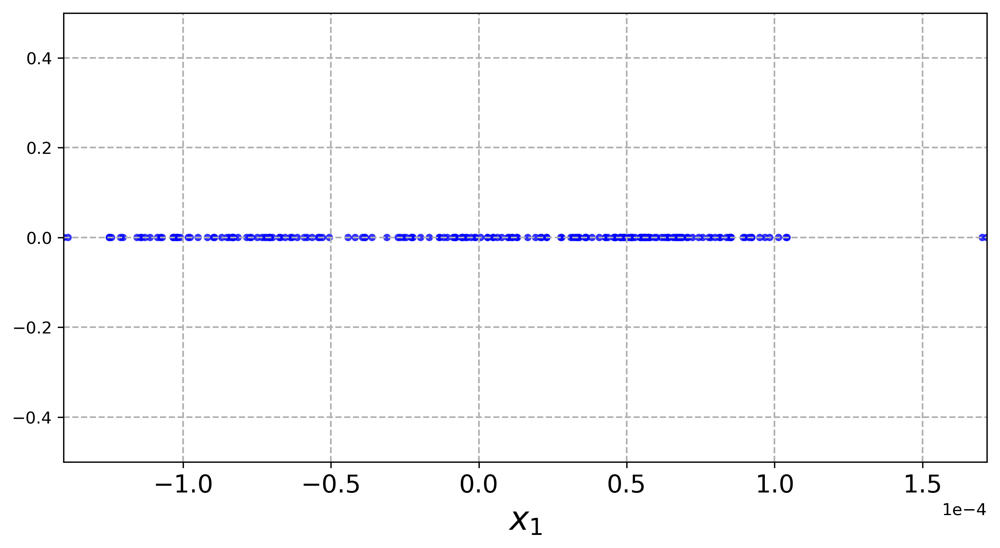

[0.37867277 0.19435957]


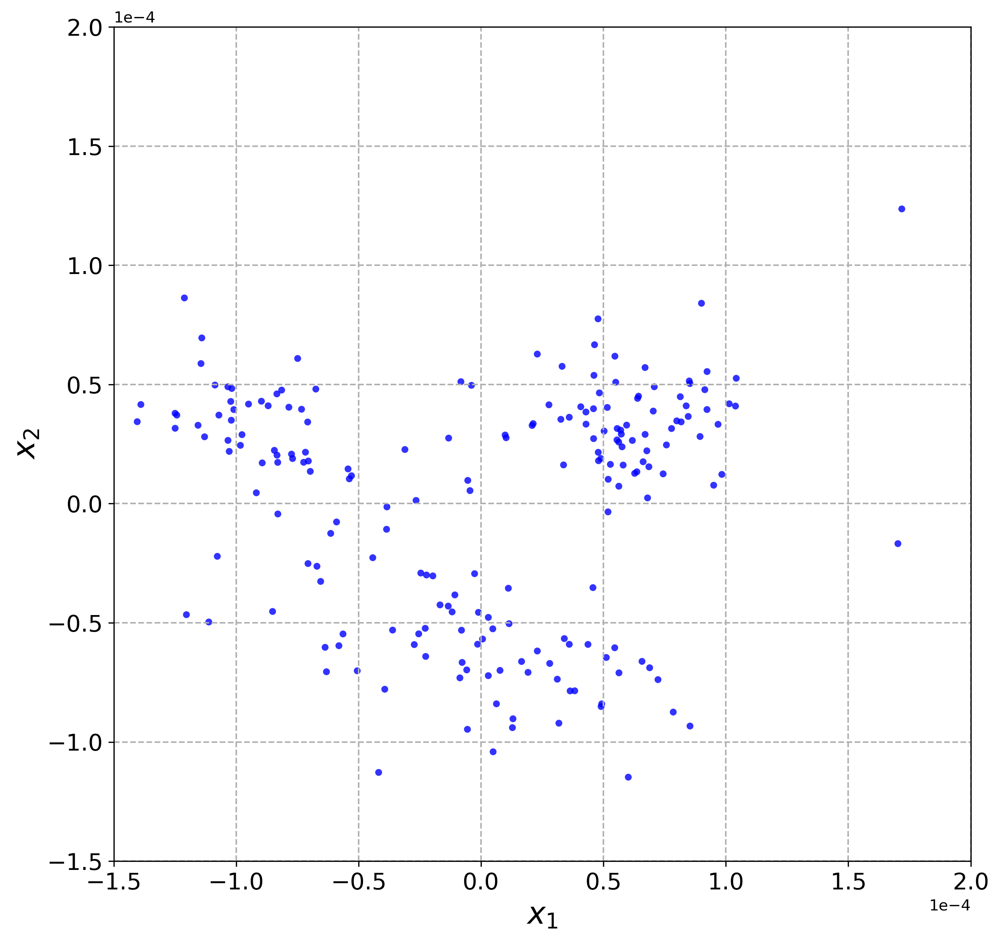

[0.37867277 0.19435957 0.12220149]


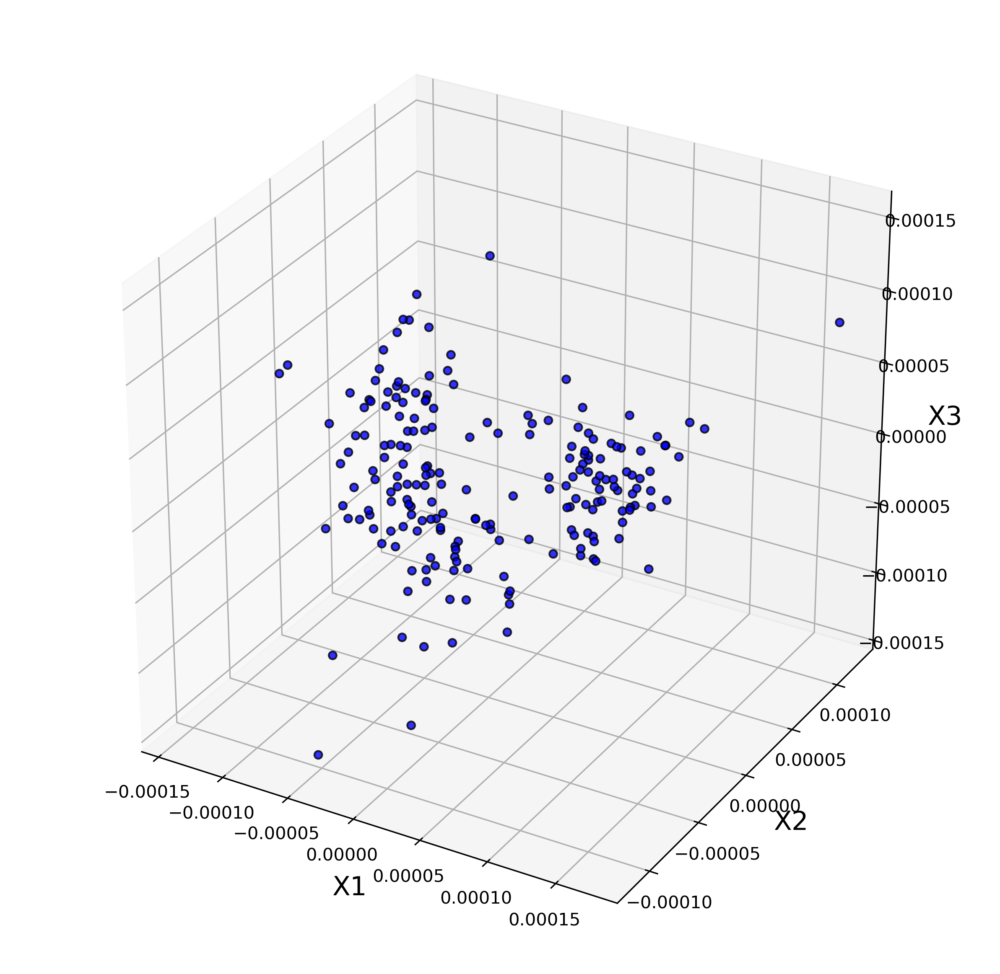

In [12]:
for name in dir():
    del globals()[name]

import numpy as np
import matplotlib.pyplot as plt
from mpl_toolkits.mplot3d import Axes3D
from sklearn.preprocessing import StandardScaler
from sklearn.decomposition import PCA
import os

#import images from data folder
ad=os.getcwd()
ad=ad+'\data\\'

X=np.loadtxt(open(ad+"spikes.csv", "rb"), delimiter=",")

#____________________
#P5_b

pca = PCA(n_components=1)
PC1D = pca.fit_transform(X)
print(pca.explained_variance_ratio_)
fig=plt.figure(figsize=[10,5],dpi=300)
plt.scatter(PC1D[:,0], np.zeros((1,PC1D.shape[0])), alpha=0.8, c='blue', edgecolors='none', s=20)
plt.axis([np.min(PC1D),np.max(PC1D),-0.5,0.5])
plt.grid('True',linestyle='--', linewidth=1)
plt.ticklabel_format(style='sci', axis='x', scilimits=(0,0))
plt.xlabel('$x_1$',fontsize=20)
plt.xticks(fontsize=15)
plt.show()
# fig.savefig('p5_b.svg',format='svg')

#____________________
#P5_c

pca = PCA(n_components=2)
PC2D = pca.fit_transform(X)
print(pca.explained_variance_ratio_)
fig=plt.figure(figsize=[10,10],dpi=300)
plt.scatter(PC2D[:,0], PC2D[:,1], alpha=0.8, c='blue', edgecolors='none', s=20)
plt.axis([-1.5e-4,2e-4,-1.5e-4,2e-4])
plt.grid('True',linestyle='--', linewidth=1)
plt.ticklabel_format(style='sci', axis='both', scilimits=(0,0))
plt.xlabel('$x_1$',fontsize=20)
plt.ylabel('$x_2$',fontsize=20)
plt.xticks(fontsize=15)
plt.yticks(fontsize=15)
plt.show()
# fig.savefig('p5_c.svg',format='svg')

#____________________
#P5_d

pca = PCA(n_components=3)
PC3D = pca.fit_transform(X)
print(pca.explained_variance_ratio_)
fig=plt.figure(figsize=[10,10],dpi=300)
ax = plt.axes(projection='3d')
ax.scatter3D(PC3D[:,0], PC3D[:,1],PC3D[:,2], alpha=0.8, c='blue', edgecolors='none', s=20)
ax.set_xlabel('X1',fontsize=15)
ax.set_ylabel('X2',fontsize=15)
ax.set_zlabel('X3',fontsize=15)
# ax.view_init(elev=20., azim=60)
plt.show()
# fig.savefig('p5_d.svg',format='svg')

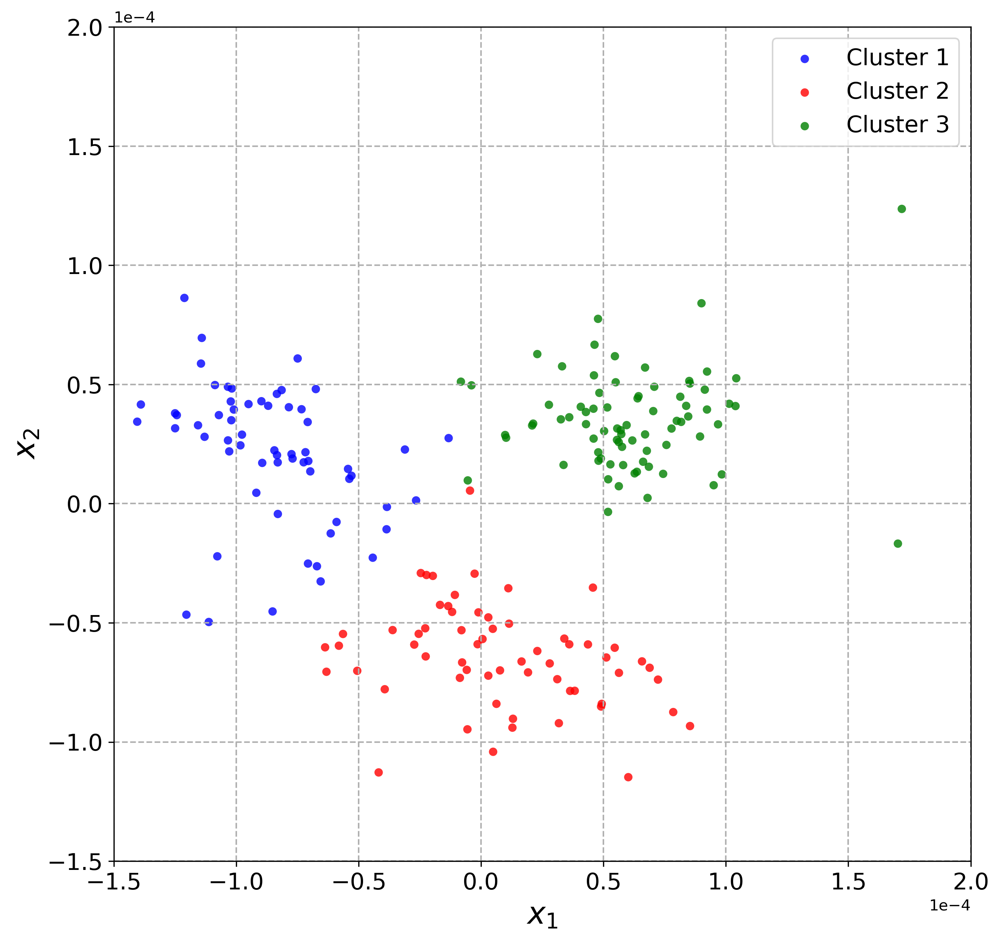

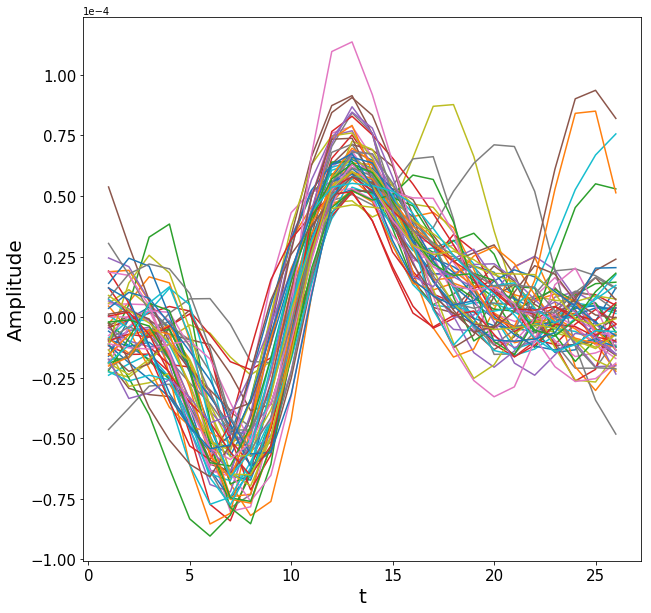

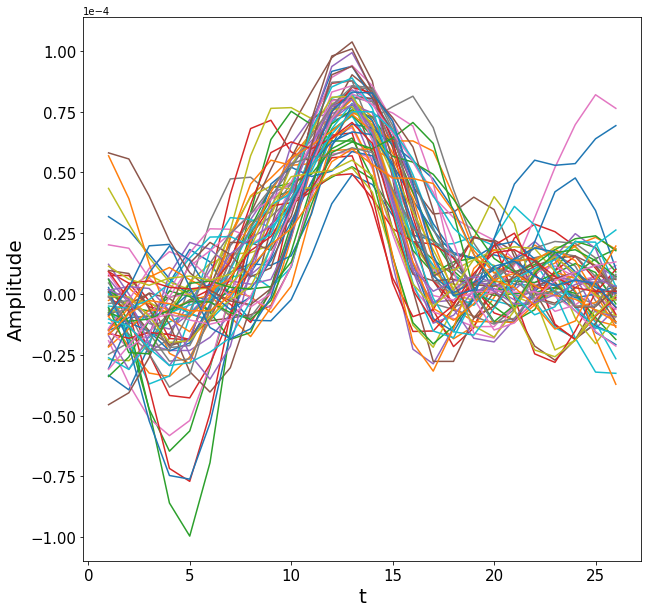

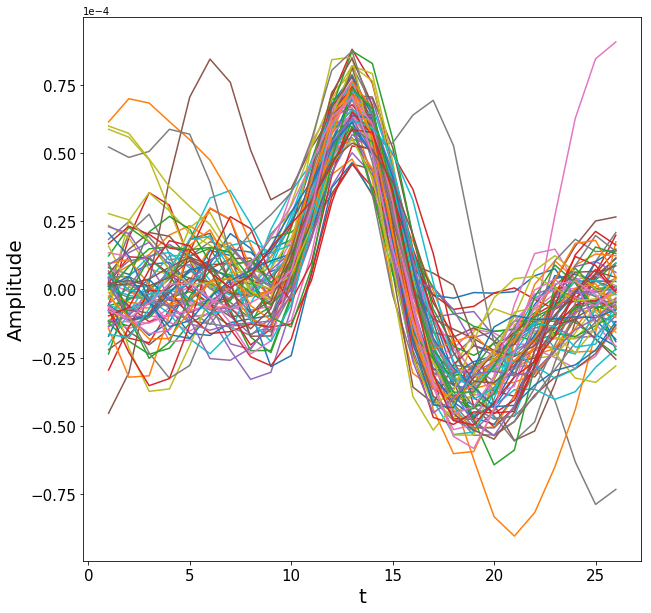

In [13]:
#P5_e
for name in dir():
    del globals()[name]
    
import numpy as np
import matplotlib.pyplot as plt
from sklearn.preprocessing import StandardScaler
from sklearn.decomposition import PCA
import os

def Batch_K_Means(E,K):
    D=np.shape(E)
    N=D[1]
    D=D[0]
    j=1
    
    #initializing mu
    mu_index=np.random.randint(N,size=K)
    mu_old=E[:,mu_index]
    d=np.zeros((K,N))

    while j<10000:#max iterations
        #distances (d) d has K rows (one for each cluster) and N columns (one for each datapoint)
        for i in np.arange(K):
            d[i,:]=np.sum((np.tile(np.reshape(mu_old[:,i],(D,1),order='C'),(1,N))-E)**2,axis=0)

        #using boolean operators to determine r from d
        r=np.equal(d,np.tile(np.amin(d,axis=0),(K,1)))*1
        
        #checking at least one data point falls into each cluster
        check=np.prod(np.sum(r,axis=1))
        if check==0:
            while check==0:
                mu_index=np.random.randint(N,size=K)
                mu_old=E[:,mu_index]
                for i in np.arange(K):
                    d[i,:]=np.sum((np.tile(np.reshape(mu_old[:,i],(D,1),order='C'),(1,N))-E)**2,axis=0)
                r=np.equal(d,np.tile(np.amin(d,axis=0),(K,1)))*1
                check=np.prod(np.sum(r,axis=1))

        #updating mu 
        mu_new=np.zeros((K,D))
        for i in np.arange(K):
            num=np.sum(np.tile(r[i,:],(D,1))*E,axis=1)
            den=np.sum(np.tile(r[i,:],(D,1)),axis=1)
            mu_new[i,:]=np.squeeze(num/den)
        mu_new=mu_new.T
    
        if np.allclose(mu_old,mu_new):
            break
        mu_old=mu_new.copy()
        j+=1
    
    J=np.zeros((K,N))    
    for i in np.arange(K):
        J[i,:]=np.sum((np.tile(np.reshape(mu_new[:,i],(D,1),order='C'),(1,N))-E)**2,axis=0)

    J=np.sum(J*r)
    for i in np.arange(K):
        d[i,:]=np.sum((np.tile(np.reshape(mu_new[:,i],(D,1),order='C'),(1,N))-E)**2,axis=0)
    r=np.equal(d,np.tile(np.amin(d,axis=0),(K,1)))*1
    return mu_new, J, j, r

#import images from data folder
ad=os.getcwd()
ad=ad+'\data\\'

X=np.loadtxt(open(ad+"spikes.csv", "rb"), delimiter=",")    

pca = PCA(n_components=2)
PC2D = pca.fit_transform(X)
PC2D=PC2D.T

D=PC2D.shape[0] #number of dimensions

K=3 #number of clusters

Result=Batch_K_Means(PC2D,K)
mu=Result[0]
r=Result[3]

fig=plt.figure(figsize=[10,10],dpi=300)
plt.scatter(PC2D[0,r[0,:]==1], PC2D[1,r[0,:]==1], alpha=0.8, c='blue', edgecolors='none', s=30,label='Cluster 1')
plt.scatter(PC2D[0,r[1,:]==1], PC2D[1,r[1,:]==1], alpha=0.8, c='red', edgecolors='none', s=30,label='Cluster 2')
plt.scatter(PC2D[0,r[2,:]==1], PC2D[1,r[2,:]==1], alpha=0.8, c='green', edgecolors='none', s=30,label='Cluster 3')
plt.legend(fontsize=15)
plt.axis([-1.5e-4,2e-4,-1.5e-4,2e-4])
plt.grid('True',linestyle='--', linewidth=1)
plt.ticklabel_format(style='sci', axis='both', scilimits=(0,0))
plt.xlabel('$x_1$',fontsize=20)
plt.ylabel('$x_2$',fontsize=20)
plt.xticks(fontsize=15)
plt.yticks(fontsize=15)
plt.show()
# fig.savefig(' p5_e.svg',format='svg')

#____________________
#P5_f

fig=plt.figure(figsize=[10,10])
for i in np.arange(PC2D.shape[1]):
    if r[0,i]==1:
        plt.plot(np.arange(1,27),X[i,:])
# plt.axis([0,30,-1,2])
plt.xlabel('t',fontsize=20)
plt.ylabel('Amplitude',fontsize=20)
plt.ticklabel_format(style='sci', axis='Y', scilimits=(0,0))
plt.xticks(fontsize=15)
plt.yticks(fontsize=15)
plt.show()
# fig.savefig(' p5_f1.svg',format='svg')

fig=plt.figure(figsize=[10,10])
for i in np.arange(PC2D.shape[1]):
    if r[1,i]==1:
        plt.plot(np.arange(1,27),X[i,:])
# plt.axis([0,30,-1,2])
plt.xlabel('t',fontsize=20)
plt.ylabel('Amplitude',fontsize=20)
plt.ticklabel_format(style='sci', axis='Y', scilimits=(0,0))
plt.xticks(fontsize=15)
plt.yticks(fontsize=15)
plt.show()
# fig.savefig(' p5_f2.svg',format='svg')

fig=plt.figure(figsize=[10,10])
for i in np.arange(PC2D.shape[1]):
    if r[2,i]==1:
        plt.plot(np.arange(1,27),X[i,:])
# plt.axis([0,30,-1,2])
plt.xlabel('t',fontsize=20)
plt.ylabel('Amplitude',fontsize=20)
plt.ticklabel_format(style='sci', axis='Y', scilimits=(0,0))
plt.xticks(fontsize=15)
plt.yticks(fontsize=15)
plt.show()
# fig.savefig(' p5_f3.svg',format='svg')
